# 🧠 Brain Tumor MRI Classification System
### Complete Pipeline: Preprocessing → 7 Models → Grad-CAM → Research Graphs
---


## PHASE 1 — Environment Setup

In [1]:
# ============================================================
# 1. Install Required Libraries
# ============================================================
!pip install -q timm
!pip install -q grad-cam==1.4.6
!pip install -q torchmetrics
!pip install -q seaborn
!pip install -q scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 37.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 15.1 MB/s eta 0:00:00


In [2]:
# ============================================================
# 2. Import Core Libraries
# ============================================================
import os
import random
import warnings
import time
from glob import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.models as models
from torchvision import transforms as T
from torchvision import datasets
from torch.utils.data import Dataset, DataLoader, random_split

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    roc_auc_score
)

import timm
from tqdm import tqdm
import torchmetrics

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

warnings.filterwarnings("ignore")

In [3]:
# ============================================================
# 3. Reproducibility Seeds
# ============================================================
SEED = 2025
import random, numpy as np, torch
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# NOTE: deterministic=True kills GPU speed by 3-5x on conv layers.
# benchmark=True lets cuDNN find the fastest kernel for your input size.
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark     = True


In [4]:
# ============================================================
# 4. GPU / Device Configuration
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("=" * 60)
print("DEVICE CONFIGURATION")
print("=" * 60)
print(f"Device Type       : {device}")
if torch.cuda.is_available():
    print(f"GPU Name          : {torch.cuda.get_device_name(0)}")
    print(f"CUDA Version      : {torch.version.cuda}")
    print(f"GPU Memory (GB)   : {round(torch.cuda.get_device_properties(0).total_memory / 1024**3, 2)}")
else:
    print("Running on CPU")

DEVICE CONFIGURATION
Device Type       : cuda
GPU Name          : Tesla T4
CUDA Version      : 12.8
GPU Memory (GB)   : 14.56


In [5]:
# ============================================================
# 5. Global Configuration
# ============================================================
IMG_SIZE    = 176
BATCH_SIZE  = 32
NUM_CLASSES = 4
EPOCHS      = 20

CLASSES = [
    "glioma",
    "meningioma",
    "no_tumor",
    "pituitary"
]

MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

print("=" * 60)
print(" PROJECT CONFIGURATION")
print("=" * 60)
print(f"Image Size        : {IMG_SIZE} x {IMG_SIZE}")
print(f"Batch Size        : {BATCH_SIZE}")
print(f"Classes           : {NUM_CLASSES}")
print(f"Class Names       : {CLASSES}")
print(f"Epochs            : {EPOCHS}")
print(f"Mean              : {MEAN}")
print(f"Std               : {STD}")


 PROJECT CONFIGURATION
Image Size        : 176 x 176
Batch Size        : 32
Classes           : 4
Class Names       : ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Epochs            : 20
Mean              : [0.485, 0.456, 0.406]
Std               : [0.229, 0.224, 0.225]


---
## PHASE 2 — Google Drive Mount & Dataset Paths
> Run this phase ONLY when preprocessing the raw dataset for the first time.
> This dataset already has pre-made `train/` and `test/` folders, each
> containing 4 class subfolders: `glioma/`, `meningioma/`, `no_tumor/`, `pituitary/`.


In [6]:
# ============================================================
# 1. Mount Google Drive
# ============================================================
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
# ============================================================
# 2. Dataset Paths (Edit these to match your Drive structure)
# ============================================================
PROJECT_ROOT = "/content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan"
DATASET_ROOT = os.path.join(PROJECT_ROOT, "Brain Tumor MRI images")
TRAIN_DIR    = os.path.join(DATASET_ROOT, "train")
TEST_DIR     = os.path.join(DATASET_ROOT, "test")

# Local Colab paths for fast training (NOT Drive)
LOCAL_PROCESSED_DIR = "/content/processed_dataset"
os.makedirs(LOCAL_PROCESSED_DIR, exist_ok=True)

print("Train Dir Exists:", os.path.exists(TRAIN_DIR))
print("Test Dir  Exists:", os.path.exists(TEST_DIR))
if os.path.exists(TRAIN_DIR):
    print("Train Classes   :", sorted(os.listdir(TRAIN_DIR)))
if os.path.exists(TEST_DIR):
    print("Test Classes    :", sorted(os.listdir(TEST_DIR)))


Train Dir Exists: True
Test Dir  Exists: True
Train Classes   : ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Test Classes    : ['glioma', 'meningioma', 'no_tumor', 'pituitary']


---
## PHASE 3 — Dataset Preprocessing & Save as .pt
> Tensors are built from raw images (in the existing `train/` and `test/` folders)
> and saved to `/content/processed_dataset/` inside Colab.
> On the **next session**, they are loaded directly from there — no download or upload needed.


In [8]:
# ============================================================
# 1. Image Transform
# ============================================================
transform = T.Compose([
    T.Resize((IMG_SIZE, IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=MEAN, std=STD)
])

In [9]:
# ============================================================
# 2. Custom MRI Dataset Class
# ============================================================
class BrainTumorMRIDataset(Dataset):

    def __init__(self, root_dir=None, transform=None,
                 image_paths=None, labels=None,
                 class_names=None, class_to_idx=None):

        self.transform = transform

        if root_dir is not None:
            self.class_names  = sorted(os.listdir(root_dir))
            self.class_to_idx = {c: i for i, c in enumerate(self.class_names)}
            self.image_paths  = []
            self.labels       = []

            for class_name in self.class_names:
                class_path = os.path.join(root_dir, class_name)
                for img_path in glob(os.path.join(class_path, "*")):
                    self.image_paths.append(img_path)
                    self.labels.append(self.class_to_idx[class_name])

        elif image_paths is not None:
            self.image_paths  = image_paths
            self.labels       = labels
            self.class_names  = class_names
            self.class_to_idx = class_to_idx
        else:
            raise ValueError("Provide root_dir or (image_paths, labels, class_names, class_to_idx).")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label, self.image_paths[idx]


In [10]:
# ============================================================
# 3. Create Datasets — SKIPPED HERE (was causing the freeze)
# ============================================================
# Building BrainTumorMRIDataset(root_dir=TRAIN_DIR/...) directly against
# the Drive-mounted folder means globbing every single file over the
# slow FUSE mount — with a large dataset this can take many minutes
# (or hang), which is what caused the KeyboardInterrupt earlier.
#
# This preview step is redundant anyway: Phase 4 (Cell 3, "Load Tensor
# .pt Datasets into RAM") rebuilds train_dataset / test_dataset from
# the cached local tensors, which is instant and needs no Drive access.
#
# So we skip it here — class distribution is now printed at the end
# of Phase 4 Cell 3 instead, once the fast local TensorDataset objects
# exist.

print("Skipping direct Drive scan (redundant + slow).")
print("Dataset objects + class distribution will be created in Phase 4.")


Skipping direct Drive scan (redundant + slow).
Dataset objects + class distribution will be created in Phase 4.


In [11]:
# ============================================================
# 4. Class Distribution — helper function (called later in Phase 4)
# ============================================================
# NOTE: This used to run immediately against train_dataset/test_dataset
# built directly from Drive in Cell 3 above. Since that step is now
# skipped (it was slow/hanging over the Drive mount), this cell just
# defines the helper. It's actually called at the end of Phase 4,
# Cell 3 — once train_dataset/test_dataset exist as fast local
# TensorDataset objects.

def count_classes(dataset):
    counts = {c: 0 for c in dataset.class_names}
    for label in dataset.labels:
        counts[dataset.class_names[label]] += 1
    return counts

print("count_classes() defined — will be used in Phase 4 after tensors load.")


count_classes() defined — will be used in Phase 4 after tensors load.


---
## ⚠️ RE-RUN THIS BEFORE PHASE 3 — Data Leakage Fix Applied
> Grad-CAM revealed the model was keying off border artifacts (black
> margins, scanner text) instead of brain anatomy. The cell below
> clears the old cached tensors so they can be rebuilt with:
> 1. **Brain cropping** (Otsu threshold + contour crop) removing
>    border artifacts before resize.
> 2. **Per-sample augmentation** (unique flip/rotation/translation/
>    zoom per image) so the model can't rely on fixed pixel positions.
>
> After rebuilding and retraining, re-run Grad-CAM — hot zones should
> move onto the tumor/brain tissue instead of image corners.


In [12]:
# ============================================================
# ⚠️ FORCE CLEAN REBUILD — run this ONCE after the leakage fix
# ============================================================
# Your existing train_tensors.pt / test_tensors.pt were built WITHOUT
# brain-cropping, so they still contain the border artifacts causing
# leakage. This wipes the old cache and local raw copy so Phase 3/4
# rebuilds everything from scratch using crop_to_brain().
#
# Run this cell ONCE, then re-run Phase 3 (Cell 5) or Phase 4 (Cell 1).

import shutil, os

for path in ["/content/brain_tumor_raw",
             "/content/processed_dataset/train_tensors.pt",
             "/content/processed_dataset/test_tensors.pt"]:
    if os.path.exists(path):
        if os.path.isdir(path):
            shutil.rmtree(path)
        else:
            os.remove(path)
        print(f"Removed: {path}")

print("Cache cleared. Re-run Phase 3/4 to rebuild with brain-cropped images.")


Cache cleared. Re-run Phase 3/4 to rebuild with brain-cropped images.


In [13]:
# ============================================================
# 5. Save Preprocessed Datasets as TENSOR .pt (fast reload, low RAM)
# ============================================================
# Tensors are built once and stored in /content/processed_dataset/.
# This cell is kept for reference. The actual build-or-load logic
# now lives in Phase 4, Cell 1 (smart loader) — run that cell instead.
#
# DATA LEAKAGE FIX: raw images are first cropped to the brain/skull
# region (Otsu threshold + largest-contour bounding box) BEFORE resize.
# This physically removes black margins, scanner text, and border
# artifacts that a model can memorize instead of learning anatomy.
#
# MEMORY FIX: images are cached as raw uint8 pixels (NOT normalized
# float32). This is 4x smaller — uint8 is 1 byte/channel vs 4 bytes
# for float32. Normalization (mean/std) happens later, per-sample,
# in TensorDataset.__getitem__ — a trivial cost, but it means we
# never hold a full-size float32 copy of the whole dataset in RAM.
#
# SPEED FIXES (unchanged): train/ and test/ are copied from Drive to
# local Colab disk once, and image decode/resize is parallelized
# with a thread pool, writing directly into a pre-allocated tensor
# (no Python list + torch.stack(), which used to double peak RAM).

import gc
import cv2
import shutil
import numpy as np
from concurrent.futures import ThreadPoolExecutor

LOCAL_PROCESSED_DIR = "/content/processed_dataset"
os.makedirs(LOCAL_PROCESSED_DIR, exist_ok=True)

TRAIN_PT_PATH = os.path.join(LOCAL_PROCESSED_DIR, "train_tensors.pt")
TEST_PT_PATH  = os.path.join(LOCAL_PROCESSED_DIR, "test_tensors.pt")

LOCAL_TRAIN_DIR = "/content/brain_tumor_raw/train"
LOCAL_TEST_DIR  = "/content/brain_tumor_raw/test"


def copy_dir_locally(drive_dir, local_dir):
    """Copies a Drive folder to local Colab disk (one-time)."""
    if os.path.exists(local_dir):
        print(f"Local copy already exists at {local_dir} — skipping copy.")
        return
    print(f"Copying {drive_dir}\n  -> {local_dir} ...")
    shutil.copytree(drive_dir, local_dir)
    print("Copy done.")


def crop_to_brain(pil_img, pad_frac=0.02, min_area_frac=0.20):
    """Crops out black margins, scanner text, and border artifacts,
    keeping only the brain/skull region. Uses Otsu thresholding to
    separate foreground (skull/brain) from the black background,
    then takes the bounding box of the largest contour.

    This directly fixes data leakage where a model learns to key off
    static border artifacts (text, edge lines) that happen to
    correlate with class labels, instead of the anatomy itself.
    """
    gray = np.array(pil_img.convert("L"))
    H, W = gray.shape

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Remove small isolated blobs (corner text, speckle) via morphological opening
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return pil_img  # fallback: nothing found, keep original

    largest = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest)

    # Reject tiny/degenerate boxes (likely noise, not the brain)
    if w < min_area_frac * W or h < min_area_frac * H:
        return pil_img

    pad_x, pad_y = int(w * pad_frac), int(h * pad_frac)
    x0, y0 = max(0, x - pad_x), max(0, y - pad_y)
    x1, y1 = min(W, x + w + pad_x), min(H, y + h + pad_y)

    return pil_img.crop((x0, y0, x1, y1))


def build_tensor_dataset(root_dir, img_size=IMG_SIZE, max_workers=8):
    """Converts raw images (organized in class subfolders under root_dir)
    into a single pre-allocated uint8 tensor. Each image is first
    cropped to the brain region (crop_to_brain) to remove border
    artifacts, then resized. No Python list + torch.stack(), so peak
    RAM stays ~4x lower than caching normalized float32 tensors."""
    resize = T.Resize((img_size, img_size))

    class_names  = sorted(os.listdir(root_dir))
    class_to_idx = {c: i for i, c in enumerate(class_names)}
    image_paths, labels = [], []
    for cls in class_names:
        cls_path = os.path.join(root_dir, cls)
        for p in glob(os.path.join(cls_path, "*")):
            image_paths.append(p)
            labels.append(class_to_idx[cls])

    n = len(image_paths)
    tensors    = torch.empty((n, 3, img_size, img_size), dtype=torch.uint8)
    out_labels = torch.empty(n, dtype=torch.long)
    kept_paths = [None] * n
    ok_mask    = torch.zeros(n, dtype=torch.bool)

    def _load_one(i):
        p, lbl = image_paths[i], labels[i]
        try:
            img = Image.open(p).convert("RGB")
            img = crop_to_brain(img)   # <-- remove border artifacts first
            img = resize(img)
            arr = torch.from_numpy(np.array(img)).permute(2, 0, 1).contiguous()  # uint8 (3,H,W)
            return i, arr, lbl, p
        except Exception as e:
            print(f"  Skipped {p}: {e}")
            return i, None, None, None

    with ThreadPoolExecutor(max_workers=max_workers) as ex:
        for i, arr, lbl, p in tqdm(ex.map(_load_one, range(n)), total=n,
                                    desc=f"  {os.path.basename(root_dir)}"):
            if arr is not None:
                tensors[i]    = arr
                out_labels[i] = lbl
                kept_paths[i] = p
                ok_mask[i]    = True

    if not ok_mask.all():
        tensors    = tensors[ok_mask]
        out_labels = out_labels[ok_mask]
        kept_paths = [p for p, ok in zip(kept_paths, ok_mask.tolist()) if ok]

    return {
        "tensors"     : tensors,      # uint8 (N,3,H,W) — NOT normalized
        "labels"      : out_labels,
        "paths"       : kept_paths,
        "class_names" : class_names,
        "class_to_idx": class_to_idx,
    }


if not (os.path.exists(TRAIN_PT_PATH) and os.path.exists(TEST_PT_PATH)):
    copy_dir_locally(TRAIN_DIR, LOCAL_TRAIN_DIR)
    copy_dir_locally(TEST_DIR,  LOCAL_TEST_DIR)

    print("Building TRAIN tensor dataset (brain-cropped, parallelized, uint8) ...")
    train_tensor_data = build_tensor_dataset(LOCAL_TRAIN_DIR)
    torch.save(train_tensor_data, TRAIN_PT_PATH)
    print(f"Saved to {TRAIN_PT_PATH}")
    del train_tensor_data
    gc.collect()   # free train tensors from RAM before building test

    print("\nBuilding TEST tensor dataset ...")
    test_tensor_data = build_tensor_dataset(LOCAL_TEST_DIR)
    torch.save(test_tensor_data, TEST_PT_PATH)
    print(f"Saved to {TEST_PT_PATH}")
    del test_tensor_data
    gc.collect()
else:
    print(".pt files already exist — skipping build. Phase 4 will load them.")

print("\nPHASE 3 Cell 5 DONE")


Copying /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/train
  -> /content/brain_tumor_raw/train ...
Copy done.
Copying /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/test
  -> /content/brain_tumor_raw/test ...
Copy done.
Building TRAIN tensor dataset (brain-cropped, parallelized, uint8) ...


  train: 100%|██████████| 14649/14649 [01:00<00:00, 240.91it/s]


Saved to /content/processed_dataset/train_tensors.pt

Building TEST tensor dataset ...


  test: 100%|██████████| 3414/3414 [00:14<00:00, 235.06it/s]


Saved to /content/processed_dataset/test_tensors.pt

PHASE 3 Cell 5 DONE


In [14]:
# ============================================================
# 6. PHASE 3 COMPLETED — tensors stored inside Colab
# ============================================================
# The .pt files now live at:
#   /content/processed_dataset/train_tensors.pt
#   /content/processed_dataset/test_tensors.pt
#
# They are loaded automatically at the start of every new session
# (see Phase 4, Cell 1 — the smart loader below).
# No download or upload is ever needed again.

print("\nPHASE 3 COMPLETED — tensors saved inside Colab.")
print("On the next session, Phase 4 will load them directly (no upload needed).")


PHASE 3 COMPLETED — tensors saved inside Colab.
On the next session, Phase 4 will load them directly (no upload needed).


---
## PHASE 4 — Load Processed Dataset & Create DataLoaders
> **Start here on every new training session.**  
> If the `.pt` files already exist in `/content/processed_dataset/`, they load instantly.  
> If they do not exist yet (fresh Colab), they are built from Drive automatically.


In [15]:
# ============================================================
# 1. Smart Build-or-Load — never download/upload again
# ============================================================
# If the .pt files already exist inside this Colab session,
# they are loaded directly (takes ~5 seconds).
# If not, they are built from the raw Drive images (runs once, ~2-3 min),
# then saved for the rest of this session.
#
# DATA LEAKAGE FIX: raw images are first cropped to the brain/skull
# region (Otsu threshold + largest-contour bounding box) BEFORE resize,
# removing black margins, scanner text, and border artifacts.
#
# MEMORY FIX: images are cached as raw uint8 pixels (NOT normalized
# float32) — 4x smaller. Normalization happens per-sample in
# TensorDataset.__getitem__ (Cell 2 below), so the full dataset is
# never held in RAM as float32.
#
# SPEED FIXES (unchanged): train/ and test/ are copied from Drive to
# local Colab disk once, and image decode/resize is parallelized
# with a thread pool, writing directly into a pre-allocated tensor.

import os, gc, cv2, torch, shutil
import numpy as np
from tqdm import tqdm
from glob import glob
from PIL import Image
from torchvision import transforms as T
from concurrent.futures import ThreadPoolExecutor

LOCAL_PROCESSED_DIR = "/content/processed_dataset"
os.makedirs(LOCAL_PROCESSED_DIR, exist_ok=True)

TRAIN_PT_PATH = os.path.join(LOCAL_PROCESSED_DIR, "train_tensors.pt")
TEST_PT_PATH  = os.path.join(LOCAL_PROCESSED_DIR, "test_tensors.pt")

LOCAL_TRAIN_DIR = "/content/brain_tumor_raw/train"
LOCAL_TEST_DIR  = "/content/brain_tumor_raw/test"


def copy_dir_locally(drive_dir, local_dir):
    """Copies a Drive folder to local Colab disk (one-time)."""
    if os.path.exists(local_dir):
        print(f"Local copy already exists at {local_dir} — skipping copy.")
        return
    print(f"Copying {drive_dir}\n  -> {local_dir} ...")
    shutil.copytree(drive_dir, local_dir)
    print("Copy done.")


def crop_to_brain(pil_img, pad_frac=0.02, min_area_frac=0.20):
    """Crops out black margins, scanner text, and border artifacts,
    keeping only the brain/skull region. Uses Otsu thresholding to
    separate foreground (skull/brain) from the black background,
    then takes the bounding box of the largest contour.

    This directly fixes data leakage where a model learns to key off
    static border artifacts (text, edge lines) that happen to
    correlate with class labels, instead of the anatomy itself.
    """
    gray = np.array(pil_img.convert("L"))
    H, W = gray.shape

    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Remove small isolated blobs (corner text, speckle) via morphological opening
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return pil_img  # fallback: nothing found, keep original

    largest = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest)

    # Reject tiny/degenerate boxes (likely noise, not the brain)
    if w < min_area_frac * W or h < min_area_frac * H:
        return pil_img

    pad_x, pad_y = int(w * pad_frac), int(h * pad_frac)
    x0, y0 = max(0, x - pad_x), max(0, y - pad_y)
    x1, y1 = min(W, x + w + pad_x), min(H, y + h + pad_y)

    return pil_img.crop((x0, y0, x1, y1))


def build_tensor_dataset(root_dir, img_size=IMG_SIZE, max_workers=8):
    """Build a uint8 tensor dataset from a class-subfoldered directory
    (runs once per session). Each image is first cropped to the brain
    region (crop_to_brain) to remove border artifacts, then resized,
    using threaded loading and a pre-allocated tensor to keep peak
    RAM low."""
    resize = T.Resize((img_size, img_size))

    class_names  = sorted(os.listdir(root_dir))
    class_to_idx = {c: i for i, c in enumerate(class_names)}
    image_paths, labels = [], []
    for cls in class_names:
        cls_path = os.path.join(root_dir, cls)
        for p in glob(os.path.join(cls_path, "*")):
            image_paths.append(p)
            labels.append(class_to_idx[cls])

    n = len(image_paths)
    tensors    = torch.empty((n, 3, img_size, img_size), dtype=torch.uint8)
    out_labels = torch.empty(n, dtype=torch.long)
    kept_paths = [None] * n
    ok_mask    = torch.zeros(n, dtype=torch.bool)

    def _load_one(i):
        p, lbl = image_paths[i], labels[i]
        try:
            img = Image.open(p).convert("RGB")
            img = crop_to_brain(img)   # <-- remove border artifacts first
            img = resize(img)
            arr = torch.from_numpy(np.array(img)).permute(2, 0, 1).contiguous()  # uint8 (3,H,W)
            return i, arr, lbl, p
        except Exception as e:
            print(f"  Skipped {p}: {e}")
            return i, None, None, None

    with ThreadPoolExecutor(max_workers=max_workers) as ex:
        for i, arr, lbl, p in tqdm(ex.map(_load_one, range(n)), total=n,
                                    desc=f"  {os.path.basename(root_dir)}"):
            if arr is not None:
                tensors[i]    = arr
                out_labels[i] = lbl
                kept_paths[i] = p
                ok_mask[i]    = True

    if not ok_mask.all():
        tensors    = tensors[ok_mask]
        out_labels = out_labels[ok_mask]
        kept_paths = [p for p, ok in zip(kept_paths, ok_mask.tolist()) if ok]

    return {
        "tensors"     : tensors,      # uint8 (N,3,H,W) — NOT normalized
        "labels"      : out_labels,
        "paths"       : kept_paths,
        "class_names" : class_names,
        "class_to_idx": class_to_idx,
    }


if os.path.exists(TRAIN_PT_PATH) and os.path.exists(TEST_PT_PATH):
    print("[FAST PATH] .pt files found — loading tensors directly (no rebuild needed) ...")
    train_raw = torch.load(TRAIN_PT_PATH, weights_only=False)
    test_raw  = torch.load(TEST_PT_PATH,  weights_only=False)
    print("Tensors loaded from disk in seconds.")
else:
    print("[FIRST RUN] .pt files not found — building from raw Drive images ...")
    # TRAIN_DIR / TEST_DIR must match your Drive structure (set in Phase 2):
    #   TRAIN_DIR/glioma, TRAIN_DIR/meningioma, TRAIN_DIR/no_tumor, TRAIN_DIR/pituitary
    #   TEST_DIR/glioma,  TEST_DIR/meningioma,  TEST_DIR/no_tumor,  TEST_DIR/pituitary
    copy_dir_locally(TRAIN_DIR, LOCAL_TRAIN_DIR)
    copy_dir_locally(TEST_DIR,  LOCAL_TEST_DIR)

    train_raw = build_tensor_dataset(LOCAL_TRAIN_DIR)
    torch.save(train_raw, TRAIN_PT_PATH)
    print(f"Saved to {TRAIN_PT_PATH}")

    test_raw = build_tensor_dataset(LOCAL_TEST_DIR)
    torch.save(test_raw, TEST_PT_PATH)
    print(f"Saved to {TEST_PT_PATH}")
    print("Next session: files found → instant load, no rebuild.")

_train_tensors = train_raw["tensors"]
_test_tensors  = test_raw["tensors"]
print(f"\nTrain tensors shape : {_train_tensors.shape}  dtype={_train_tensors.dtype}")
print(f"Test  tensors shape : {_test_tensors.shape}  dtype={_test_tensors.dtype}")
print("PHASE 4 CELL 1 DONE")


[FAST PATH] .pt files found — loading tensors directly (no rebuild needed) ...
Tensors loaded from disk in seconds.

Train tensors shape : torch.Size([14649, 3, 176, 176])  dtype=torch.uint8
Test  tensors shape : torch.Size([3414, 3, 176, 176])  dtype=torch.uint8
PHASE 4 CELL 1 DONE


In [16]:
# ============================================================
# 2. In-Memory Tensor Dataset Class
# ============================================================
# Tensors are stored as raw uint8 pixels (see Phase 3/4 build step).
# Normalization (mean/std) happens HERE, per-sample, at read-time —
# a trivial per-image cost, but it means the full dataset is never
# held in RAM as float32 (4x smaller while cached/loaded).

class TensorDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict, transform=None):
        self.tensors      = data_dict["tensors"]        # uint8 (N, 3, H, W)
        self.labels       = data_dict["labels"]          # (N,) long
        self.paths        = data_dict["paths"]
        self.class_names  = data_dict["class_names"]
        self.class_to_idx = data_dict["class_to_idx"]
        self.transform    = transform
        self.mean = torch.tensor(MEAN).view(3, 1, 1)
        self.std  = torch.tensor(STD).view(3, 1, 1)

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img   = self.tensors[idx].float() / 255.0    # uint8 -> float32 [0,1]
        img   = (img - self.mean) / self.std          # normalize
        label = self.labels[idx].item()
        path  = self.paths[idx]
        if self.transform:
            img = self.transform(img)
        return img, label, path


In [17]:
# ============================================================
# 3. Load Tensor .pt Datasets into RAM
# ============================================================
# Paths must match where the smart loader (Phase 4 Cell 1) saved them.
# train_raw / test_raw are already in memory if you ran Cell 1 above —
# this cell just wraps them into TensorDataset objects.

if 'train_raw' not in dir() or 'test_raw' not in dir():
    # Fallback: load from disk if smart loader was skipped
    _TRAIN_PT = os.path.join(LOCAL_PROCESSED_DIR, "train_tensors.pt")
    _TEST_PT  = os.path.join(LOCAL_PROCESSED_DIR, "test_tensors.pt")
    print(f"Loading {_TRAIN_PT} into RAM ...")
    train_raw = torch.load(_TRAIN_PT, weights_only=False)
    print(f"Loading {_TEST_PT} into RAM ...")
    test_raw  = torch.load(_TEST_PT,  weights_only=False)
else:
    print("train_raw / test_raw already in memory from Phase 4 Cell 1 — skipping reload.")

train_dataset = TensorDataset(train_raw)
test_dataset  = TensorDataset(test_raw)

CLASS_NAMES   = train_dataset.class_names
CLASS_TO_IDX  = train_dataset.class_to_idx
NUM_CLASSES   = len(CLASS_NAMES)

print(f"\nTrain samples : {len(train_dataset)}")
print(f"Test  samples : {len(test_dataset)}")
print(f"Classes       : {CLASS_NAMES}")
print(f"Tensor shape  : {train_dataset.tensors.shape}")
print("All tensors are in RAM — training will be fast.")


# ============================================================
# 4. Class Distribution (moved here — fast, no Drive access needed)
# ============================================================
train_counts = count_classes(train_dataset)
test_counts  = count_classes(test_dataset)

print("\nTRAIN DISTRIBUTION:")
for cls, cnt in train_counts.items():
    print(f"  {cls:<30} : {cnt}")

print("\nTEST DISTRIBUTION:")
for cls, cnt in test_counts.items():
    print(f"  {cls:<30} : {cnt}")


train_raw / test_raw already in memory from Phase 4 Cell 1 — skipping reload.

Train samples : 14649
Test  samples : 3414
Classes       : ['glioma', 'meningioma', 'no_tumor', 'pituitary']
Tensor shape  : torch.Size([14649, 3, 176, 176])
All tensors are in RAM — training will be fast.

TRAIN DISTRIBUTION:
  glioma                         : 4165
  meningioma                     : 3512
  no_tumor                       : 3011
  pituitary                      : 3961

TEST DISTRIBUTION:
  glioma                         : 1009
  meningioma                     : 852
  no_tumor                       : 627
  pituitary                      : 926


In [18]:
# ============================================================
# 4. Train / Validation Split  (80% / 20%)
# ============================================================
train_size = int(0.80 * len(train_dataset))
val_size   = len(train_dataset) - train_size

train_data, val_data = torch.utils.data.random_split(
    train_dataset,
    [train_size, val_size],
    generator=torch.Generator().manual_seed(SEED)
)

print(f"Training Samples   : {len(train_data)}")
print(f"Validation Samples : {len(val_data)}")
print(f"Testing Samples    : {len(test_dataset)}")


Training Samples   : 11719
Validation Samples : 2930
Testing Samples    : 3414


In [19]:
# ============================================================
# 5. DataLoaders  +  Per-Sample Augmentation (anti-leakage)
# ============================================================
# LEAKAGE FIX: augmentation is now applied PER-SAMPLE (unique random
# flip / rotation / translation / zoom for every image, every epoch)
# instead of one shared random transform for the whole batch. A
# single per-batch transform still lets a model key off a fixed
# corner/border position across many images in the same batch;
# per-sample randomization breaks that positional correlation.
#
# FILL-COLOR FIX: rotation/translation exposes corners that need to
# be filled with something. TF.affine's default fill is 0 — but this
# runs AFTER normalization, so 0 does NOT mean black here. It maps to
# the mean pixel value, which shows up as a brownish-tan tint (visible
# in the "TRAIN MRI SAMPLES" plot). We instead fill with the
# normalized equivalent of true black: (0 - mean) / std per channel.

BATCH_SIZE = 64   # override global; change back to 32 if OOM

import torchvision.transforms.functional as TF

# Normalized equivalent of a true-black (0) pixel, per channel
FILL_VALUE = [(-m / s) for m, s in zip(MEAN, STD)]  # e.g. [-2.1179, -2.0357, -1.8044]

def batch_augment(batch):
    """
    Collate + augment a batch, applying a DIFFERENT random
    flip/rotation/translation/zoom to every sample.
    """
    imgs, labels, paths = zip(*batch)
    imgs   = torch.stack(imgs)      # (B, C, H, W)
    labels = torch.tensor(labels, dtype=torch.long)

    B, C, H, W = imgs.shape
    out = torch.empty_like(imgs)

    for i in range(B):
        img = imgs[i]

        if torch.rand(1).item() > 0.5:
            img = TF.hflip(img)

        angle = (torch.rand(1).item() * 30) - 15          # ±15°
        tx    = (torch.rand(1).item() * 0.10 - 0.05) * W   # ±5% width shift
        ty    = (torch.rand(1).item() * 0.10 - 0.05) * H   # ±5% height shift
        scale = 1.0 + (torch.rand(1).item() * 0.20 - 0.10)  # 0.9x - 1.1x zoom

        img = TF.affine(
            img, angle=angle, translate=[int(tx), int(ty)],
            scale=scale, shear=[0.0, 0.0], fill=FILL_VALUE
        )
        out[i] = img

    return out, labels, list(paths)

# val/test use standard collate (no augmentation)
def standard_collate(batch):
    imgs, labels, paths = zip(*batch)
    return torch.stack(imgs), torch.tensor(labels, dtype=torch.long), list(paths)

train_loader = DataLoader(
    train_data,
    batch_size  = BATCH_SIZE,
    shuffle     = True,
    num_workers = 0,
    pin_memory  = False,
    collate_fn  = batch_augment,
    drop_last   = True,     # avoids tiny last batch slowing down steps
)
val_loader = DataLoader(
    val_data,
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    num_workers = 0,
    pin_memory  = False,
    collate_fn  = standard_collate,
)
test_loader = DataLoader(
    test_dataset,
    batch_size  = BATCH_SIZE,
    shuffle     = False,
    num_workers = 0,
    pin_memory  = False,
    collate_fn  = standard_collate,
)

print(f"Batch size         : {BATCH_SIZE}")
print(f"Train batches      : {len(train_loader)}")
print(f"Validation batches : {len(val_loader)}")
print(f"Test batches       : {len(test_loader)}")

# Benchmark
import time
t0 = time.time()
imgs, lbls, _ = next(iter(train_loader))
print(f"First batch shape  : {imgs.shape}")
print(f"First batch time   : {time.time()-t0:.3f}s")
print("PHASE 4 COMPLETED — DataLoaders ready")


Batch size         : 64
Train batches      : 183
Validation batches : 46
Test batches       : 54
First batch shape  : torch.Size([64, 3, 176, 176])
First batch time   : 0.311s
PHASE 4 COMPLETED — DataLoaders ready


---
## PHASE 5 — Data Visualization

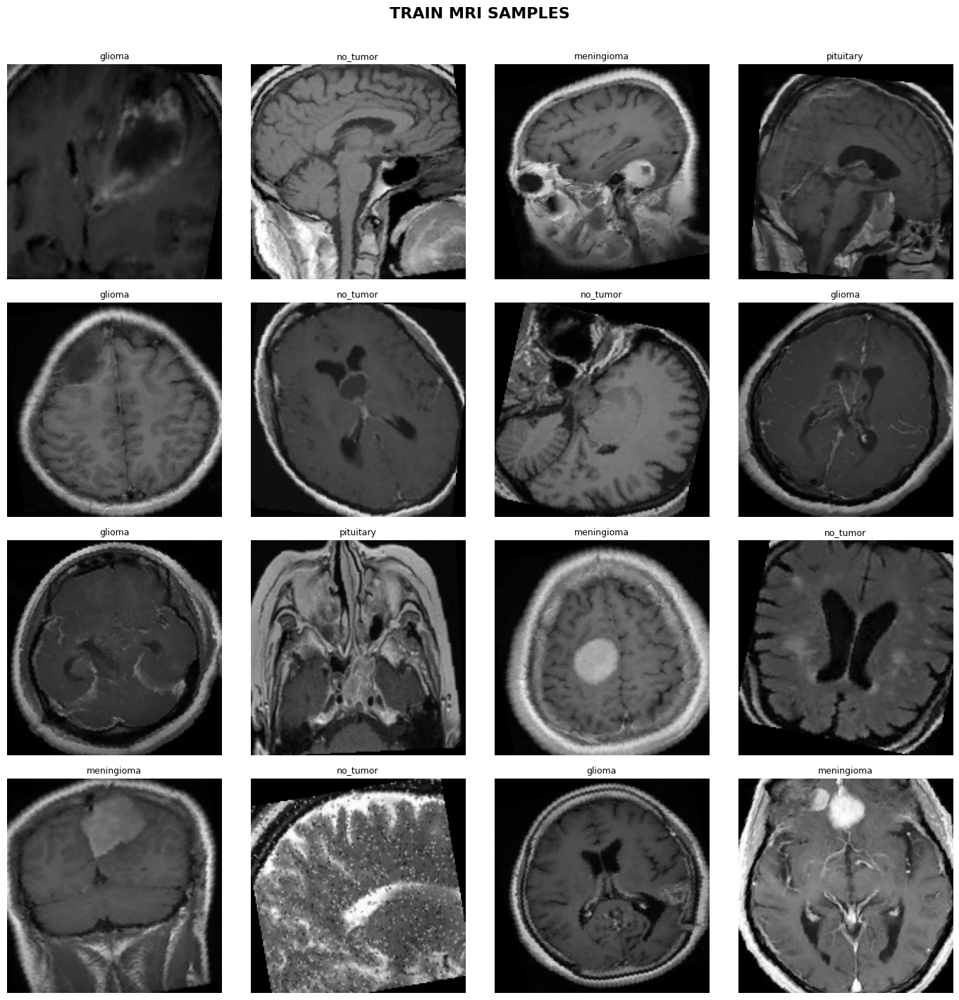

In [20]:
# ============================================================
# Denormalization Helper
# ============================================================
def denormalize(tensor, mean=MEAN, std=STD):
    img = tensor.clone().detach().cpu().numpy()
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    img = np.transpose(img, (1, 2, 0))
    return np.clip(img, 0, 1)

def visualize_samples(loader, class_names, title, rows=4, cols=4):
    images, labels, _ = next(iter(loader))
    plt.figure(figsize=(14, 14))
    plt.suptitle(title, fontsize=16, fontweight='bold', y=1.01)
    n = min(rows * cols, len(images))
    for i in range(n):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(denormalize(images[i]), cmap="gray")
        plt.title(class_names[labels[i]], fontsize=9)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

visualize_samples(train_loader, CLASS_NAMES, "TRAIN MRI SAMPLES")

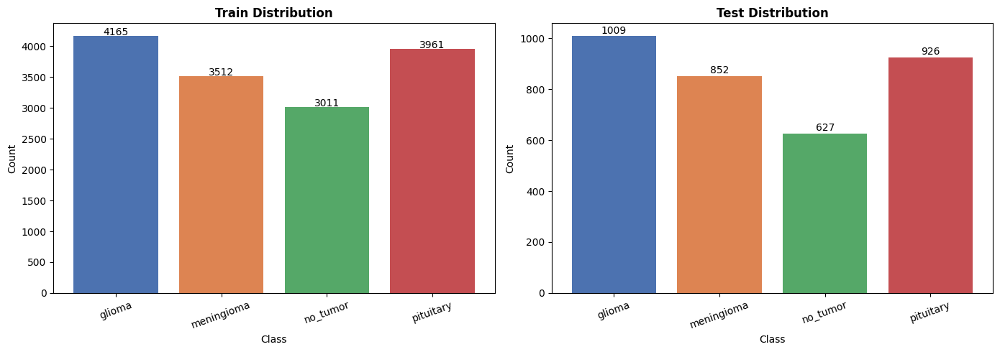

PHASE 5 COMPLETED


In [21]:
# ============================================================
# Dataset Distribution Bar Chart
# ============================================================
def get_distribution(dataset):
    counts = {c: 0 for c in dataset.class_names}
    for lbl in dataset.labels:
        counts[dataset.class_names[lbl]] += 1
    return counts

train_counts = get_distribution(train_dataset)
test_counts  = get_distribution(test_dataset)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, counts, title in zip(axes,
                              [train_counts, test_counts],
                              ["Train Distribution", "Test Distribution"]):
    bars = ax.bar(counts.keys(), counts.values(), color=['#4C72B0','#DD8452','#55A868','#C44E52'])
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel("Class")
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', rotation=20)
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10,
                str(int(bar.get_height())), ha='center', fontsize=10)

plt.tight_layout()
plt.show()
print("PHASE 5 COMPLETED")

---
## PHASE 6 — Shared Training & Evaluation Engine
> These functions are used by all 7 models. Run once.

In [22]:
# ============================================================
# FIXED: Shared Training Engine
# Changes: (FIXED in this change request)
#   1. torch.amp instead of torch.cuda.amp (deprecation fix)
#   2. Handles InceptionV3 aux_logits tuple output during train mode
#   3. Correctly handles ReduceLROnPlateau scheduler.step(val_loss)
# ============================================================
import sys, shutil, os as _os
import torch.amp
import threading

def train_model(model, model_name, train_loader, val_loader,
                criterion, optimizer, scheduler=None, epochs=EPOCHS):

    local_path = f"/content/{model_name}_best.pth"
    drive_dir  = "/content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models"
    _os.makedirs(drive_dir, exist_ok=True)
    drive_path = f"{drive_dir}/{model_name}_best.pth"

    # Fixed: use torch.amp instead of deprecated torch.cuda.amp
    scaler = torch.amp.GradScaler('cuda')

    best_val_acc = 0.0
    train_losses, val_losses         = [], []
    train_accuracies, val_accuracies = [], []

    print(f"\n{'='*60}")
    print(f" TRAINING: {model_name}")
    print(f"{'='*60}")
    sys.stdout.flush()

    start_time = time.time()

    for epoch in range(epochs):
        # ── TRAIN ────────────────────────────────────────────
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for batch_idx, (images, labels, _) in enumerate(train_loader):
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            # Fixed: use torch.amp.autocast instead of deprecated version
            with torch.amp.autocast('cuda'):
                outputs = model(images)

                # FIX: InceptionV3 returns a named tuple (logits, aux_logits)
                # during training when aux_logits=True
                if isinstance(outputs, tuple):
                    logits, aux_logits_out = outputs[0], outputs[1]
                    loss = criterion(logits, labels)
                    if aux_logits_out is not None:
                        loss += 0.4 * criterion(aux_logits_out, labels)
                    outputs = logits  # use main logits for accuracy
                else:
                    loss = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer)
            scaler.update()

            running_loss += loss.item()
            _, predicted  = torch.max(outputs, 1)
            total        += labels.size(0)
            correct      += (predicted == labels).sum().item()

            if (batch_idx + 1) % 20 == 0:
                print(f"  Epoch {epoch+1}/{epochs} | Batch {batch_idx+1}/{len(train_loader)} | "
                      f"Loss: {running_loss/(batch_idx+1):.4f}", end='\r')
                sys.stdout.flush()

        train_loss = running_loss / len(train_loader)
        train_acc  = 100 * correct / total
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        # ── VALIDATE ─────────────────────────────────────────
        model.eval()
        val_loss_sum, correct, total = 0.0, 0, 0
        with torch.no_grad():
            for images, labels, _ in val_loader:
                images = images.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                with torch.amp.autocast('cuda'):
                    outputs = model(images)
                    # In eval mode InceptionV3 returns plain tensor, but be safe
                    if isinstance(outputs, tuple):
                        outputs = outputs[0]
                    loss = criterion(outputs, labels)
                val_loss_sum += loss.item()
                _, predicted  = torch.max(outputs, 1)
                total        += labels.size(0)
                correct      += (predicted == labels).sum().item()

        val_loss = val_loss_sum / len(val_loader)
        val_acc  = 100 * correct / total
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        # FIX: Correctly call scheduler.step() for ReduceLROnPlateau
        if scheduler:
            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(val_loss) # Pass validation loss for ReduceLROnPlateau
            else:
                scheduler.step()         # For other schedulers like CosineAnnealingLR

        # ── SAVE BEST → local + Drive (non-blocking) ─────────
        saved = ""
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), local_path)
            def _copy():
                try:
                    shutil.copy2(local_path, drive_path)
                except:
                    pass
            threading.Thread(target=_copy, daemon=True).start()
            saved = "  <- Best Saved (local + Drive)"

        print(f"Epoch [{epoch+1:02d}/{epochs}]  "
              f"Train Loss: {train_loss:.4f}  Train Acc: {train_acc:.2f}%  "
              f"Val Loss: {val_loss:.4f}  Val Acc: {val_acc:.2f}%{saved}")
        sys.stdout.flush()

    elapsed = time.time() - start_time
    print(f"\nTraining Time : {elapsed/60:.1f} min")
    print(f"Best Val Acc  : {best_val_acc:.2f}%")
    print(f"Saved locally : {local_path}")
    print(f"Saved to Drive: {drive_path}")
    sys.stdout.flush()

    return {
        "train_losses"    : train_losses,
        "val_losses"      : val_losses,
        "train_accuracies": train_accuracies,
        "val_accuracies"  : val_accuracies,
        "best_val_acc"    : best_val_acc,
        "save_path"       : local_path,
        "drive_path"      : drive_path,
        "training_time"   : elapsed
    }

In [23]:
# ============================================================
# Evaluation Function (Test Set)
# ============================================================
def evaluate_model(model, test_loader, class_names, model_name):

    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs   = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    all_preds  = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs  = np.array(all_probs)

    accuracy = 100 * np.sum(all_preds == all_labels) / len(all_labels)

    print(f"\n{'='*60}")
    print(f" TEST EVALUATION: {model_name}")
    print(f"{'='*60}")
    print(f"\nTest Accuracy : {accuracy:.2f}%")
    print("\nClassification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    return {
        "accuracy"  : accuracy,
        "preds"     : all_preds,
        "labels"    : all_labels,
        "probs"     : all_probs
    }

In [24]:
# ============================================================
# Cross-Session Result Storage (Google Drive)
# Saves only the small numbers PHASE 14 needs, so the comparison
# dashboard can be rebuilt in ANY future runtime/session without
# needing to retrain or re-hold every model in memory at once.
# ============================================================
import json

RESULTS_DIR = "/content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models/results"
os.makedirs(RESULTS_DIR, exist_ok=True)

def save_model_result(model_name, eval_dict, history_dict, mean_auc):
    """Call this once, right after evaluating a model (any session).
    Writes a tiny JSON to Drive so PHASE 14 can pick it up later,
    even in a completely different Colab runtime/day."""
    result = {
        "Model": model_name,
        "Test Accuracy (%)": float(eval_dict["accuracy"]),
        "Mean AUC": float(mean_auc),
        "Training Time (min)": float(history_dict["training_time"]) / 60,
        "Best Val Acc (%)": float(history_dict["best_val_acc"]),
    }
    path = f"{RESULTS_DIR}/{model_name.replace(' ', '_').replace('-', '_')}_result.json"
    with open(path, "w") as f:
        json.dump(result, f, indent=2)
    print(f"Saved -> {path}")

def load_all_model_results():
    """Reads every *_result.json in Drive and returns a DataFrame.
    Works from a totally fresh runtime — only needs Drive mounted."""
    rows = []
    for fname in sorted(os.listdir(RESULTS_DIR)):
        if fname.endswith("_result.json"):
            with open(os.path.join(RESULTS_DIR, fname)) as f:
                rows.append(json.load(f))
    if not rows:
        raise FileNotFoundError(
            f"No result files found in {RESULTS_DIR}. "
            "Evaluate at least one model first (this calls save_model_result())."
        )
    return pd.DataFrame(rows)


In [25]:
# ============================================================
# Plot Training Curves
# ============================================================
def plot_training_curves(history, model_name):

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"{model_name} — Training Curves", fontsize=14, fontweight='bold')

    axes[0].plot(history["train_losses"],     label="Train Loss",     color='#4C72B0')
    axes[0].plot(history["val_losses"],       label="Val Loss",       color='#DD8452')
    axes[0].set_title("Loss")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(history["train_accuracies"], label="Train Accuracy", color='#55A868')
    axes[1].plot(history["val_accuracies"],   label="Val Accuracy",   color='#C44E52')
    axes[1].set_title("Accuracy (%)")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy (%)")
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

In [26]:
# ============================================================
# Plot Confusion Matrix
# ============================================================
def plot_confusion_matrix(eval_results, class_names, model_name):

    cm = confusion_matrix(eval_results["labels"], eval_results["preds"])

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"{model_name} — Confusion Matrix", fontweight='bold')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

In [27]:
# ============================================================
# Plot ROC Curves (One-vs-Rest per class)
# ============================================================
def plot_roc_curves(eval_results, class_names, model_name):

    labels     = eval_results["labels"]
    probs      = eval_results["probs"]
    n_classes  = len(class_names)

    plt.figure(figsize=(9, 7))

    auc_scores = []
    for i, cls in enumerate(class_names):
        binary_labels = (labels == i).astype(int)
        fpr, tpr, _   = roc_curve(binary_labels, probs[:, i])
        roc_auc       = auc(fpr, tpr)
        auc_scores.append(roc_auc)
        plt.plot(fpr, tpr, label=f"{cls}  (AUC = {roc_auc:.4f})")

    plt.plot([0,1],[0,1],'k--', lw=1)
    plt.title(f"{model_name} — ROC Curves (One-vs-Rest)", fontweight='bold')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    mean_auc = np.mean(auc_scores)
    print(f"Mean AUC: {mean_auc:.4f}")
    return mean_auc, auc_scores

In [28]:
# ============================================================
# Confidence Distribution Plot
# ============================================================
def plot_confidence_distribution(eval_results, class_names, model_name):

    probs  = eval_results["probs"]
    preds  = eval_results["preds"]
    labels = eval_results["labels"]

    max_conf = np.max(probs, axis=1)
    correct  = (preds == labels)

    plt.figure(figsize=(9, 5))
    plt.hist(max_conf[correct],  bins=30, alpha=0.7, label="Correct",   color='#55A868')
    plt.hist(max_conf[~correct], bins=30, alpha=0.7, label="Incorrect", color='#C44E52')
    plt.title(f"{model_name} — Confidence Distribution", fontweight='bold')
    plt.xlabel("Max Confidence Score")
    plt.ylabel("Count")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

In [29]:
# ============================================================
# Error Analysis — Show Misclassified Samples
# ============================================================
def plot_error_analysis(model, test_loader, class_names, model_name, n_samples=8):

    model.eval()
    wrong_images, wrong_preds, wrong_labels = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images_gpu, labels_gpu = images.to(device), labels.to(device)
            outputs  = model(images_gpu)
            _, preds = torch.max(outputs, 1)

            mask = (preds != labels_gpu)
            for i in range(len(mask)):
                if mask[i]:
                    wrong_images.append(images[i])
                    wrong_preds.append(preds[i].item())
                    wrong_labels.append(labels[i].item())

                if len(wrong_images) >= n_samples:
                    break
            if len(wrong_images) >= n_samples:
                break

    if not wrong_images:
        print("No misclassified samples found!")
        return

    cols = 4
    rows = (len(wrong_images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(14, rows * 3.5))
    fig.suptitle(f"{model_name} — Misclassified Samples", fontsize=13, fontweight='bold')
    axes = axes.flatten() if rows > 1 else [axes] if cols == 1 else axes

    for i in range(len(wrong_images)):
        img = denormalize(wrong_images[i])
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(
            f"True: {class_names[wrong_labels[i]]}\nPred: {class_names[wrong_preds[i]]}",
            fontsize=8, color='red'
        )
        axes[i].axis("off")

    for j in range(len(wrong_images), len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()
    print(f"Total misclassified shown: {len(wrong_images)}")

In [30]:
# ============================================================
# Grad-CAM Visualization Function
# ============================================================
def run_gradcam(model, model_name, target_layer, test_loader,
                class_names, n_samples=8, reshape_transform=None):
    """
    Generates Grad-CAM heatmaps overlaid on MRI images.

    Parameters
    ----------
    model        : trained PyTorch model
    model_name   : string label for titles
    target_layer : the conv layer to hook  (e.g. model.features[-1])
    test_loader  : DataLoader
    class_names  : list of class name strings
    n_samples    : number of images to visualize
    """

    # Store original requires_grad states for ALL model parameters
    original_requires_grad_states = {}
    for name, param in model.named_parameters():
        original_requires_grad_states[name] = param.requires_grad
        param.requires_grad = True # Temporarily enable gradients for all

    model.eval()

    if reshape_transform is not None:
        # Needed for transformer backbones (ViT / Swin): reshapes the
        # (batch, tokens, channels) sequence back into a spatial
        # (batch, channels, H, W) map that Grad-CAM can operate on.
        cam = GradCAM(model=model, target_layers=[target_layer],
                      reshape_transform=reshape_transform)
    else:
        cam = GradCAM(model=model, target_layers=[target_layer])

    sample_images, sample_labels, _ = [], [], []
    collected = 0

    for images, labels, _ in test_loader:
        for i in range(len(images)):
            sample_images.append(images[i])
            sample_labels.append(labels[i].item())
            collected += 1
            if collected >= n_samples:
                break
        if collected >= n_samples:
            break

    cols = 4
    rows = (n_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols * 2, figsize=(cols * 5, rows * 4))
    fig.suptitle(f"{model_name} — Grad-CAM Heatmaps", fontsize=14, fontweight='bold')

    for i in range(n_samples):
        img_tensor = sample_images[i].unsqueeze(0).to(device)
        true_label = sample_labels[i]

        # Forward pass to get prediction
        with torch.no_grad():
            output = model(img_tensor)
            pred_label = torch.argmax(output, dim=1).item()

        # Grad-CAM for predicted class
        targets   = [ClassifierOutputTarget(pred_label)]
        grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0]

        # Denormalize for overlay
        rgb_img = np.ascontiguousarray(denormalize(sample_images[i]).astype(np.float32))
        cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        row  = i // cols
        col  = (i % cols) * 2

        # Original MRI
        axes[row, col].imshow(rgb_img, cmap='gray')
        axes[row, col].set_title(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
            fontsize=8,
            color='green' if true_label == pred_label else 'red'
        )
        axes[row, col].axis('off')

        # Grad-CAM Overlay
        axes[row, col + 1].imshow(cam_image)
        axes[row, col + 1].set_title("Grad-CAM", fontsize=8)
        axes[row, col + 1].axis('off')

    # Hide unused axes
    total_axes = rows * cols * 2
    for j in range(n_samples * 2, total_axes):
        r, c = divmod(j, cols * 2)
        axes[r, c].axis('off')

    plt.tight_layout()
    plt.show()
    print(f"Grad-CAM complete for {model_name}")

    # Restore original requires_grad states
    for name, param in model.named_parameters():
        param.requires_grad = original_requires_grad_states[name]


---
## PHASE 7 — Model 1: VGG16

In [31]:
# ============================================================
# VGG16 — Build Model
# ============================================================
MODEL_NAME = "VGG16"

vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

# Freeze early layers, unfreeze last 2 conv blocks (features[24:])
for param in vgg16.features.parameters():
    param.requires_grad = False
for param in vgg16.features[24:].parameters():
    param.requires_grad = True

# Improved classifier head
vgg16.classifier[6] = nn.Sequential(
    nn.Linear(4096, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

vgg16 = vgg16.to(device)
trainable = sum(p.numel() for p in vgg16.parameters() if p.requires_grad)
print(f"VGG16 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:08<00:00, 68.7MB/s]


VGG16 trainable params: 128,724,996


In [32]:
# Quick sanity check — run this before training
import sys
criterion = nn.CrossEntropyLoss() # Define criterion locally for this check
vgg16.train()
images, labels, _ = next(iter(train_loader))
images, labels = images.to(device), labels.to(device)
outputs = vgg16(images)
loss = criterion(outputs, labels)
loss.backward()
print("Forward + backward pass: OK")
print(f"Output shape: {outputs.shape}")
sys.stdout.flush()

Forward + backward pass: OK
Output shape: torch.Size([64, 4])


In [33]:
import torch.optim as optim

# ============================================================
# VGG16 — Train
# ============================================================
criterion_vgg16  = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vgg16  = optim.AdamW(
    filter(lambda p: p.requires_grad, vgg16.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_vgg16  = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vgg16, T_max=EPOCHS, eta_min=1e-6
)

history_vgg16 = train_model(
    model=vgg16, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_vgg16, optimizer=optimizer_vgg16,
    scheduler=scheduler_vgg16, epochs=EPOCHS
)



 TRAINING: VGG16
Epoch [01/20]  Train Loss: 0.6889  Train Acc: 83.73%  Val Loss: 0.5538  Val Acc: 90.44%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.5110  Train Acc: 93.56%  Val Loss: 0.4844  Val Acc: 94.03%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.4665  Train Acc: 95.50%  Val Loss: 0.4708  Val Acc: 94.95%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.4468  Train Acc: 96.63%  Val Loss: 0.4533  Val Acc: 95.94%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.4210  Train Acc: 97.49%  Val Loss: 0.5060  Val Acc: 93.62%
Epoch [06/20]  Train Loss: 0.4152  Train Acc: 97.89%  Val Loss: 0.4342  Val Acc: 96.66%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.4024  Train Acc: 98.20%  Val Loss: 0.4112  Val Acc: 97.65%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.3894  Train Acc: 98.80%  Val Loss: 0.4051  Val Acc: 97.88%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.3836  Train Acc: 99.01%  Val Los


 TEST EVALUATION: VGG16

Test Accuracy : 96.60%

Classification Report:

              precision    recall  f1-score   support

      glioma       0.96      0.95      0.96      1009
  meningioma       0.97      0.93      0.95       852
    no_tumor       0.96      1.00      0.98       627
   pituitary       0.97      1.00      0.98       926

    accuracy                           0.97      3414
   macro avg       0.97      0.97      0.97      3414
weighted avg       0.97      0.97      0.97      3414



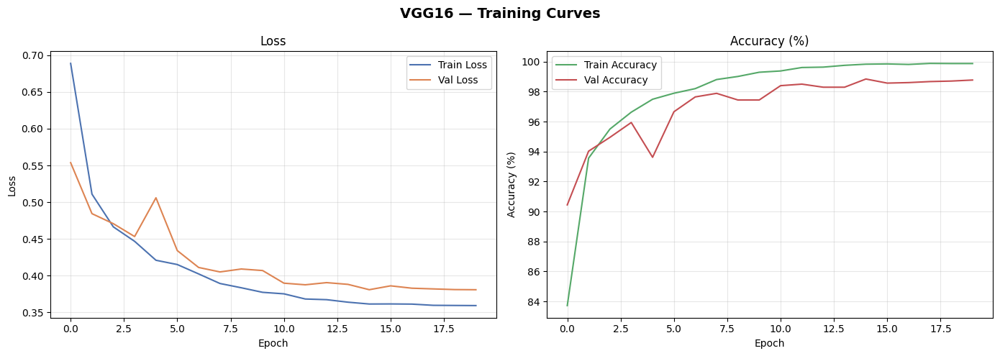

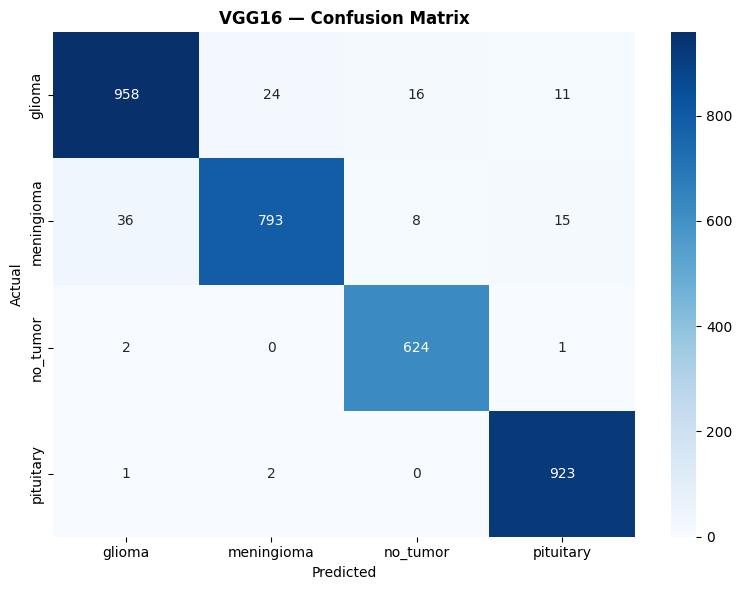

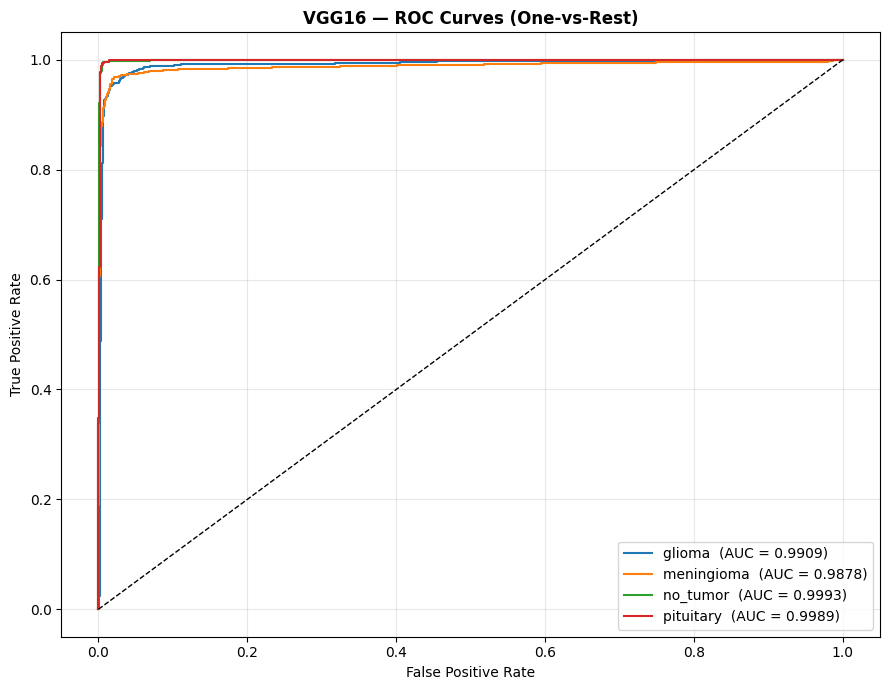

Mean AUC: 0.9942


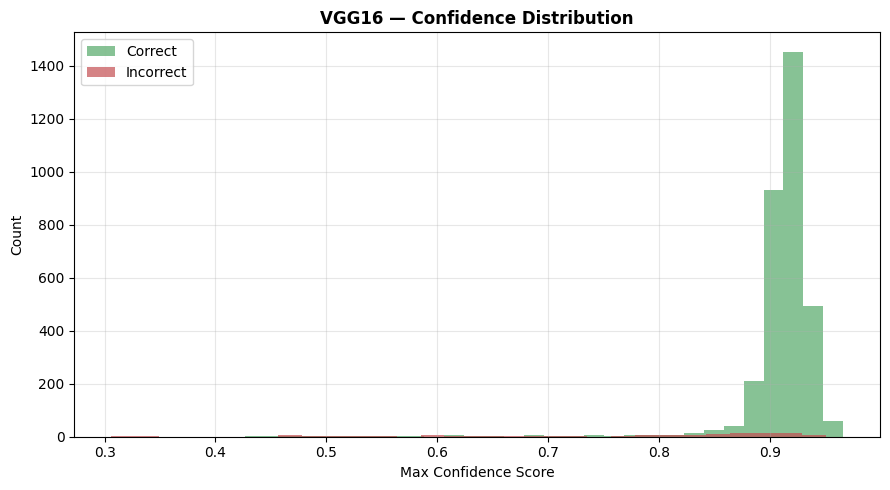

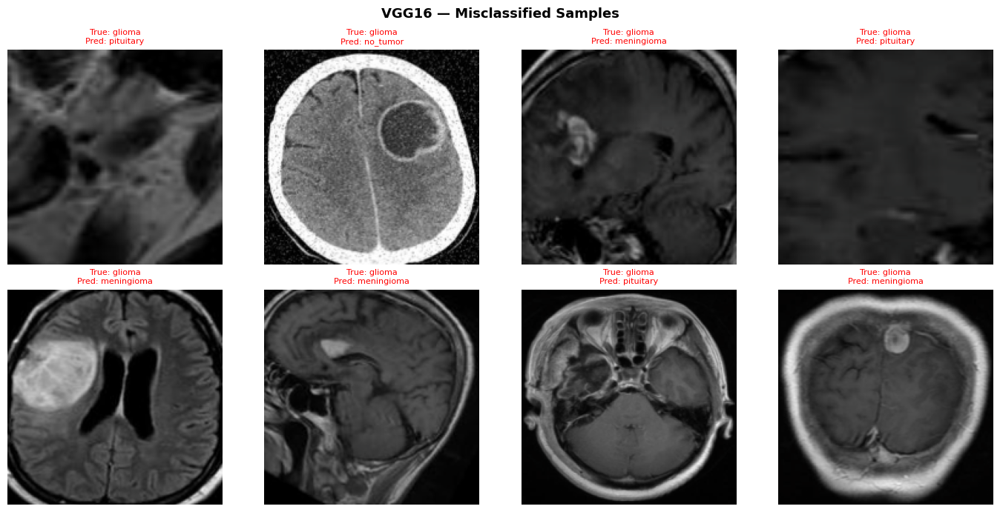

Total misclassified shown: 8


In [34]:
# ============================================================
# VGG16 — Load Best & Evaluate
# ============================================================
vgg16.load_state_dict(torch.load(history_vgg16["save_path"], map_location=device))

eval_vgg16 = evaluate_model(vgg16, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vgg16, MODEL_NAME)
plot_confusion_matrix(eval_vgg16, CLASS_NAMES, MODEL_NAME)
mean_auc_vgg16, auc_scores_vgg16 = plot_roc_curves(eval_vgg16, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vgg16, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vgg16, test_loader, CLASS_NAMES, MODEL_NAME)

In [35]:
save_model_result("VGG16", eval_vgg16, history_vgg16, mean_auc_vgg16)


Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models/results/VGG16_result.json


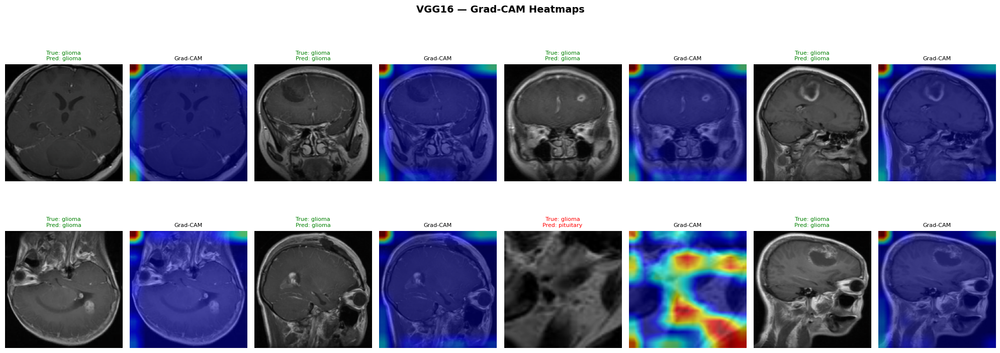

Grad-CAM complete for VGG16


In [36]:
# ============================================================
# VGG16 — Grad-CAM
# ============================================================
# Target layer: last conv block in VGG16 features
run_gradcam(
    model=vgg16,
    model_name=MODEL_NAME,
    target_layer=vgg16.features[-3],  # Conv2d layer before MaxPool
    test_loader=test_loader,
    class_names=CLASS_NAMES,
    n_samples=8
)

---
## PHASE 8 — Model 2: VGG19

In [58]:
# ============================================================
# VGG19 — Build Model
# ============================================================
MODEL_NAME = "VGG19"

vgg19 = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1)

for param in vgg19.features.parameters():
    param.requires_grad = False
for param in vgg19.features[28:].parameters():   # unfreeze last 2 blocks
    param.requires_grad = True

vgg19.classifier[6] = nn.Sequential(
    nn.Linear(4096, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

vgg19 = vgg19.to(device)
trainable = sum(p.numel() for p in vgg19.parameters() if p.requires_grad)
print(f"VGG19 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:09<00:00, 58.4MB/s]


VGG19 trainable params: 131,084,804


In [59]:
# ============================================================
# VGG19 — Train
# ============================================================
criterion_vgg19  = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vgg19  = optim.AdamW(
    filter(lambda p: p.requires_grad, vgg19.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_vgg19  = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vgg19, T_max=EPOCHS, eta_min=1e-6
)

history_vgg19 = train_model(
    model=vgg19, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_vgg19, optimizer=optimizer_vgg19,
    scheduler=scheduler_vgg19, epochs=EPOCHS
)



 TRAINING: VGG19
Epoch [01/20]  Train Loss: 0.7187  Train Acc: 82.19%  Val Loss: 0.5792  Val Acc: 90.10%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.5389  Train Acc: 92.18%  Val Loss: 0.4990  Val Acc: 92.80%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.4809  Train Acc: 94.85%  Val Loss: 0.4649  Val Acc: 94.95%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.4497  Train Acc: 96.12%  Val Loss: 0.4598  Val Acc: 95.32%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.4316  Train Acc: 97.10%  Val Loss: 0.4323  Val Acc: 96.55%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.4228  Train Acc: 97.36%  Val Loss: 0.4196  Val Acc: 97.10%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.4086  Train Acc: 98.00%  Val Loss: 0.4220  Val Acc: 96.76%
Epoch [08/20]  Train Loss: 0.3991  Train Acc: 98.30%  Val Loss: 0.4050  Val Acc: 97.58%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.3916  Train Acc: 98.67%  Val Los


 TEST EVALUATION: VGG19

Test Accuracy : 95.49%

Classification Report:

              precision    recall  f1-score   support

      glioma       0.92      0.95      0.94      1009
  meningioma       0.96      0.89      0.92       852
    no_tumor       0.97      1.00      0.98       627
   pituitary       0.97      0.99      0.98       926

    accuracy                           0.95      3414
   macro avg       0.96      0.96      0.96      3414
weighted avg       0.96      0.95      0.95      3414



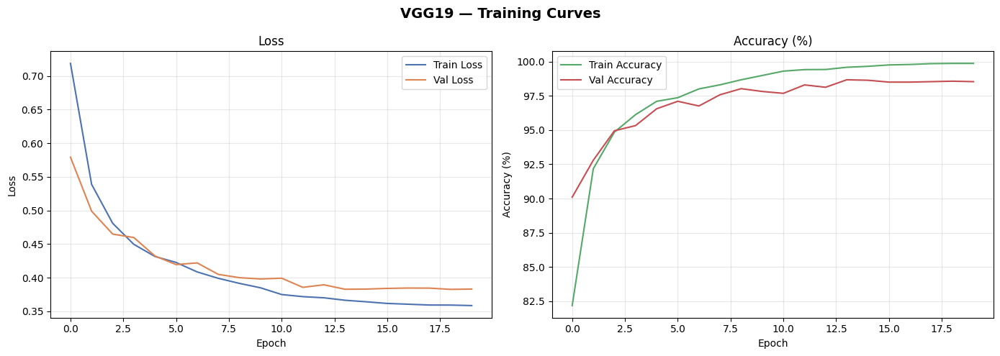

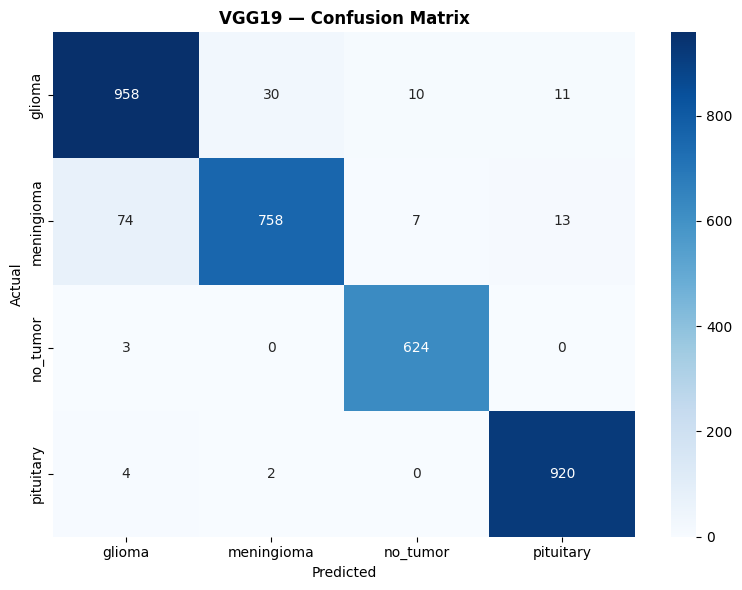

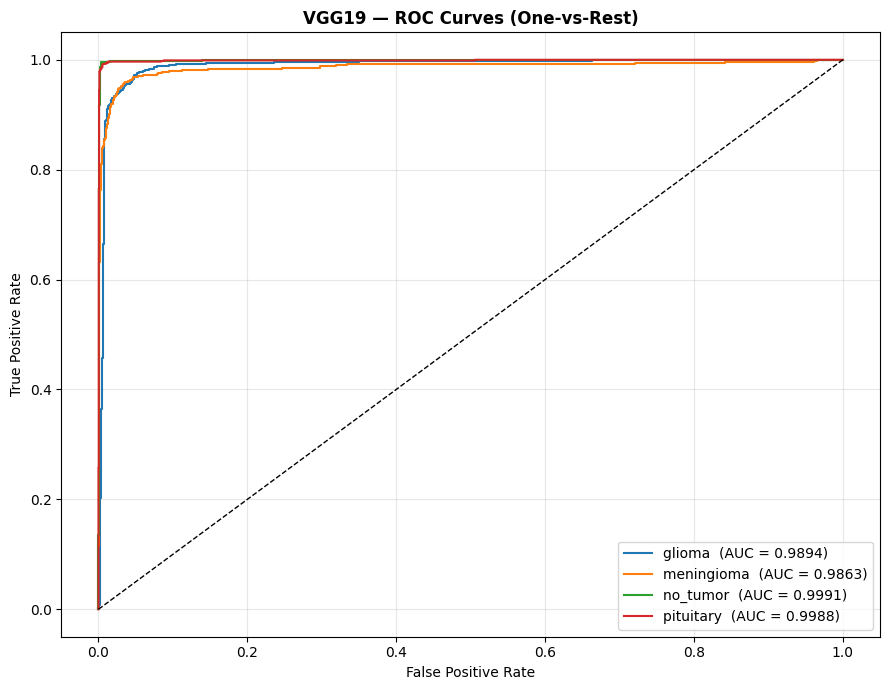

Mean AUC: 0.9934


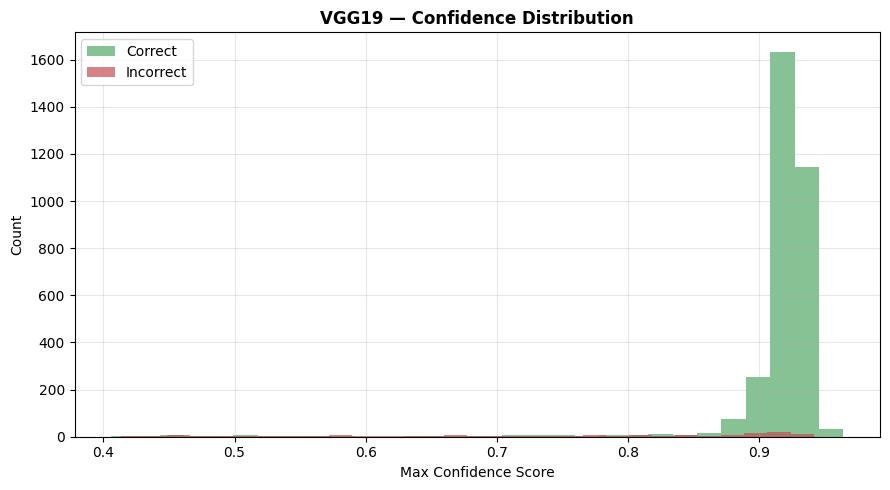

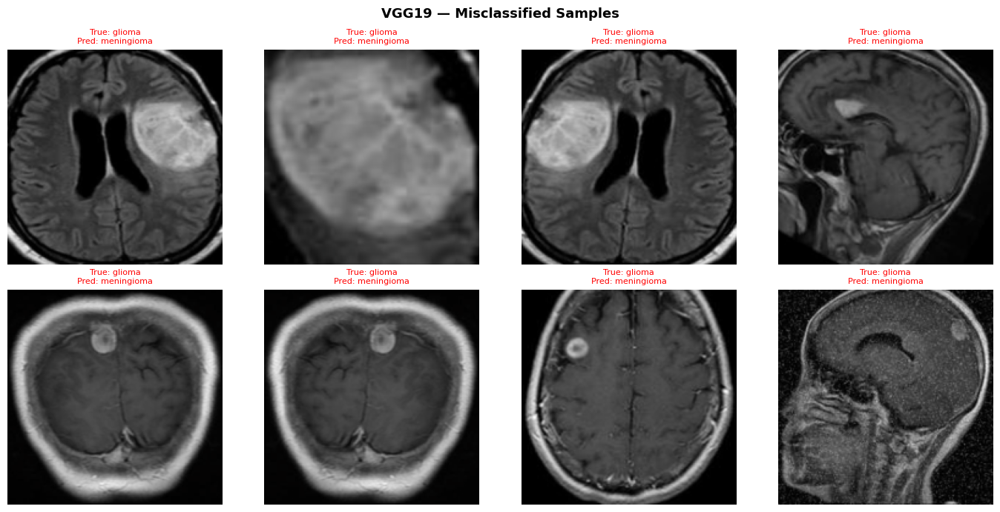

Total misclassified shown: 8


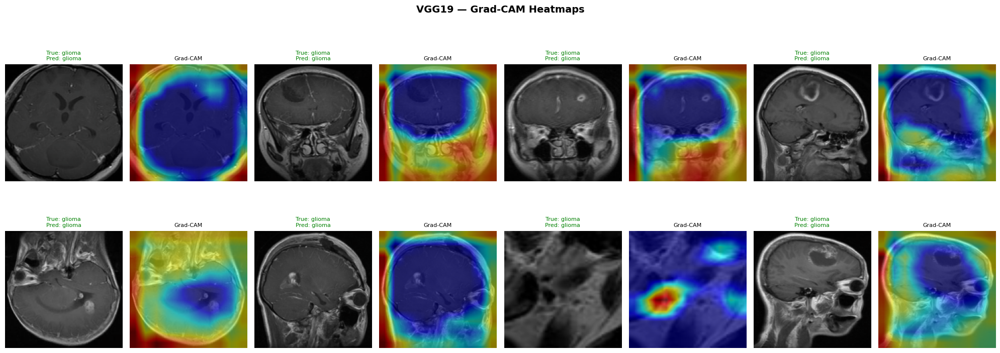

Grad-CAM complete for VGG19


In [60]:
# ============================================================
# VGG19 — Evaluate + Grad-CAM
# ============================================================
vgg19.load_state_dict(torch.load(history_vgg19["save_path"], map_location=device))

eval_vgg19 = evaluate_model(vgg19, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vgg19, MODEL_NAME)
plot_confusion_matrix(eval_vgg19, CLASS_NAMES, MODEL_NAME)
mean_auc_vgg19, auc_scores_vgg19 = plot_roc_curves(eval_vgg19, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vgg19, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vgg19, test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(vgg19, MODEL_NAME, vgg19.features[-3], test_loader, CLASS_NAMES)

In [61]:
save_model_result("VGG19", eval_vgg19, history_vgg19, mean_auc_vgg19)


Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models/results/VGG19_result.json


---
## PHASE 9 — Model 3: DenseNet121

In [ ]:
# ============================================================
# DenseNet121 — Build Model
# ============================================================
MODEL_NAME = "DenseNet121"

densenet = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)

# Freeze early, unfreeze denseblock3, denseblock4, norm5
for param in densenet.features.parameters():
    param.requires_grad = False
for param in densenet.features.denseblock3.parameters():
    param.requires_grad = True
for param in densenet.features.denseblock4.parameters():
    param.requires_grad = True
for param in densenet.features.norm5.parameters():
    param.requires_grad = True

densenet.classifier = nn.Sequential(
    nn.Linear(densenet.classifier.in_features, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.4),
    nn.Linear(512, NUM_CLASSES)
)

densenet = densenet.to(device)
trainable = sum(p.numel() for p in densenet.parameters() if p.requires_grad)
print(f"DenseNet121 trainable params: {trainable:,}")


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 172MB/s]


DenseNet121 trainable params: 5,524,740


In [ ]:
# ============================================================
# DenseNet121 — Train
# ============================================================
criterion_densenet = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_densenet = optim.AdamW(
    filter(lambda p: p.requires_grad, densenet.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_densenet = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_densenet, T_max=EPOCHS, eta_min=1e-6
)

history_densenet = train_model(
    model=densenet, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_densenet, optimizer=optimizer_densenet,
    scheduler=scheduler_densenet, epochs=EPOCHS
)



 TRAINING: DenseNet121
Epoch [01/20]  Train Loss: 0.5659  Train Acc: 89.75%  Val Loss: 0.4483  Val Acc: 95.94%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.4361  Train Acc: 96.39%  Val Loss: 0.4045  Val Acc: 97.82%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.4095  Train Acc: 97.75%  Val Loss: 0.3878  Val Acc: 98.43%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.3951  Train Acc: 98.32%  Val Loss: 0.3885  Val Acc: 98.26%
Epoch [05/20]  Train Loss: 0.3852  Train Acc: 98.69%  Val Loss: 0.3899  Val Acc: 98.26%
Epoch [06/20]  Train Loss: 0.3760  Train Acc: 99.15%  Val Loss: 0.3733  Val Acc: 98.98%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.3692  Train Acc: 99.43%  Val Loss: 0.3747  Val Acc: 98.98%
Epoch [08/20]  Train Loss: 0.3676  Train Acc: 99.34%  Val Loss: 0.3684  Val Acc: 99.25%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.3633  Train Acc: 99.68%  Val Loss: 0.3690  Val Acc: 99.22%
Epoch [10/20]  Train Loss: 0.


 TEST EVALUATION: DenseNet121

Test Accuracy : 98.48%

Classification Report:

              precision    recall  f1-score   support

      glioma       0.99      0.97      0.98      1009
  meningioma       0.98      0.97      0.98       852
    no_tumor       0.98      1.00      0.99       627
   pituitary       0.99      1.00      0.99       926

    accuracy                           0.98      3414
   macro avg       0.98      0.99      0.99      3414
weighted avg       0.98      0.98      0.98      3414



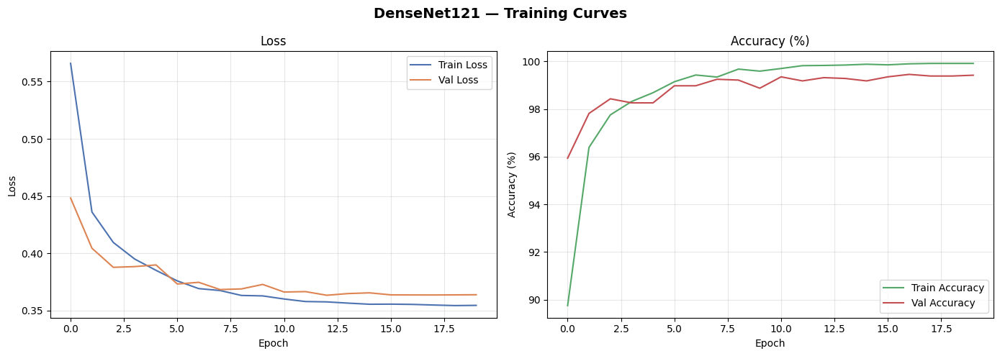

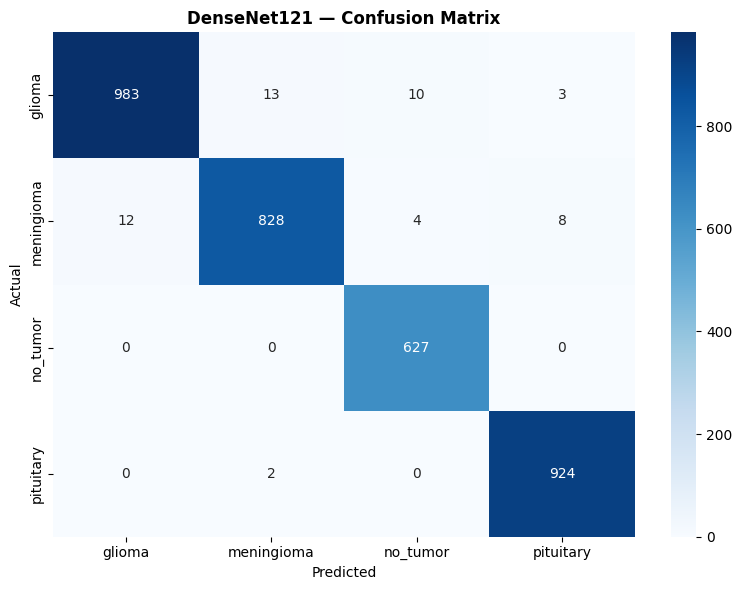

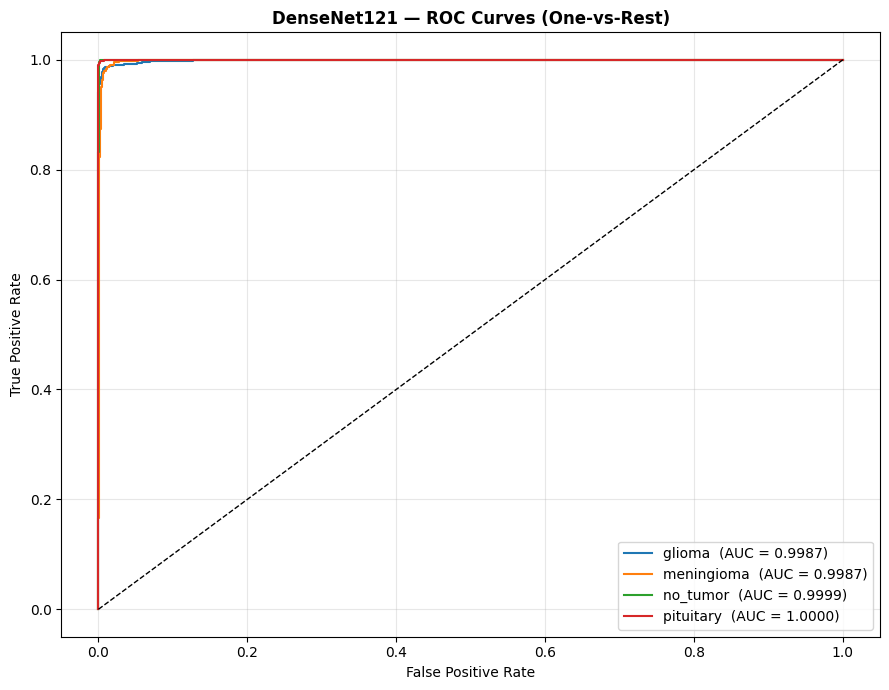

Mean AUC: 0.9993


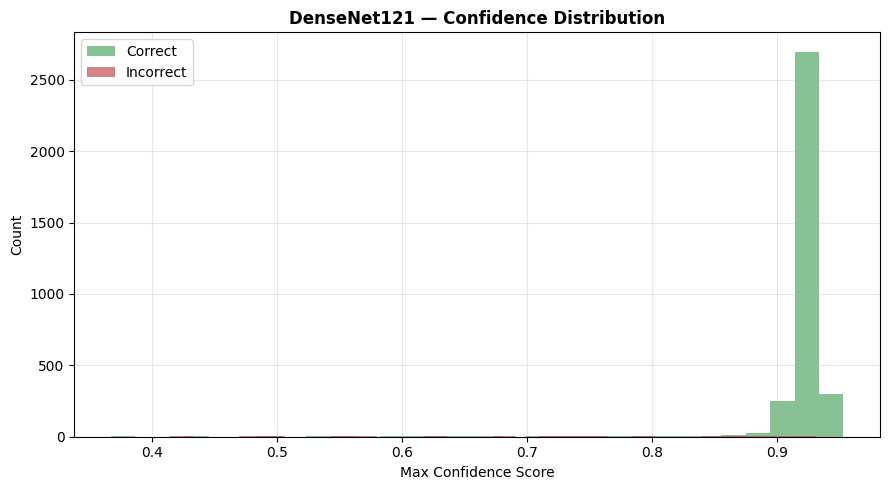

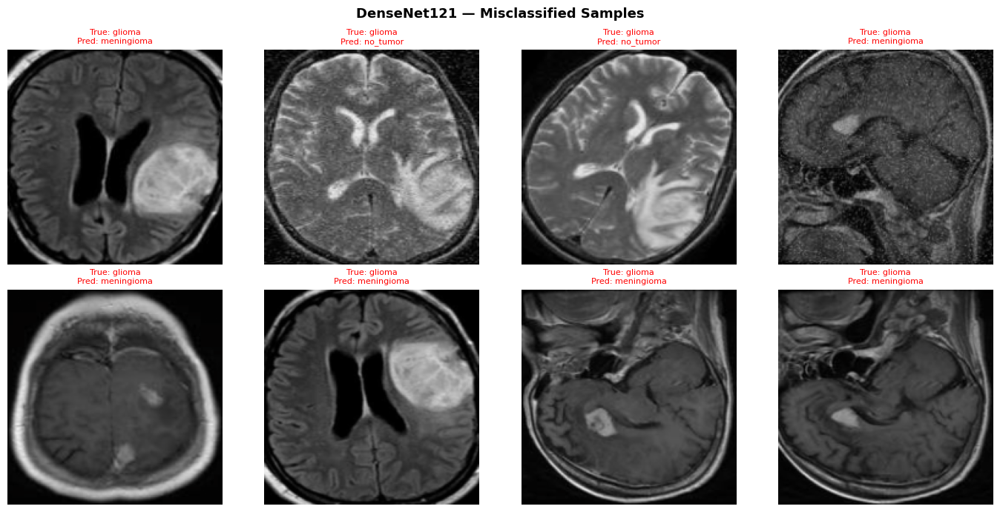

Total misclassified shown: 8


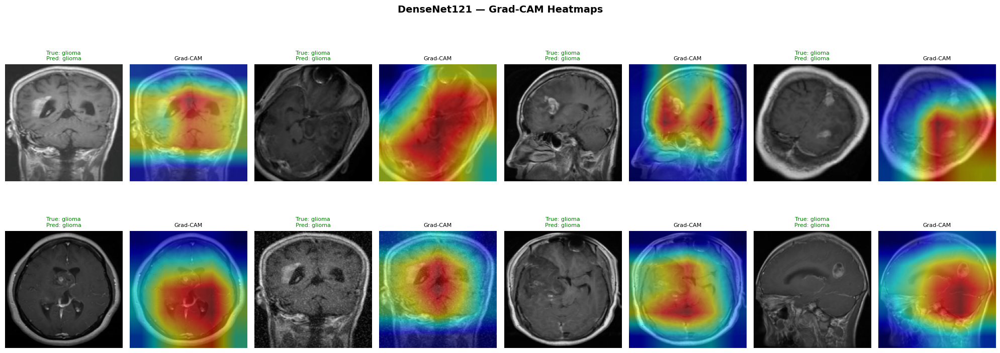

Grad-CAM complete for DenseNet121


In [ ]:
# ============================================================
# DenseNet121 — Evaluate + Grad-CAM
# ============================================================
densenet.load_state_dict(torch.load(history_densenet["save_path"], map_location=device))

eval_densenet = evaluate_model(densenet, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_densenet, MODEL_NAME)
plot_confusion_matrix(eval_densenet, CLASS_NAMES, MODEL_NAME)
mean_auc_densenet, auc_scores_densenet = plot_roc_curves(eval_densenet, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_densenet, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(densenet, test_loader, CLASS_NAMES, MODEL_NAME)

# Grad-CAM target: last dense block's norm layer acts as proxy
run_gradcam(densenet, MODEL_NAME, densenet.features.denseblock4, test_loader, CLASS_NAMES)

In [ ]:
save_model_result("DenseNet121", eval_densenet, history_densenet, mean_auc_densenet)


Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models/results/DenseNet121_result.json


---
## PHASE 10 — Model 4: InceptionV3

In [37]:
# ============================================================
# FIXED: InceptionV3 — Dedicated 299x299 DataLoaders
# Root cause: InceptionV3 needs >=299x299; 176x176 collapses
# spatial dims to 2x2 before a 5x5 conv → RuntimeError.
# Fix: build a separate loader that resizes to 299x299.
# ============================================================

INCEPTION_SIZE = 299

_inception_transform = T.Compose([
    T.Resize((INCEPTION_SIZE, INCEPTION_SIZE)),
    T.Normalize(mean=[0.0, 0.0, 0.0], std=[1.0, 1.0, 1.0])  # tensors already normalized
])

class InceptionTensorDataset(torch.utils.data.Dataset):
    """Re-sizes already-normalized tensors to 299x299 on the fly."""
    def __init__(self, base_dataset):
        self.base = base_dataset

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, label, path = self.base[idx]
        img = T.functional.resize(img, [INCEPTION_SIZE, INCEPTION_SIZE],
                                  interpolation=T.InterpolationMode.BILINEAR,
                                  antialias=True)
        return img, label, path

# Wrap existing split datasets
inc_train_data = InceptionTensorDataset(train_data)
inc_val_data   = InceptionTensorDataset(val_data)
inc_test_data  = InceptionTensorDataset(test_dataset)

def standard_collate(batch):
    imgs, labels, paths = zip(*batch)
    return torch.stack(imgs), torch.tensor(labels, dtype=torch.long), list(paths)

inc_train_loader = DataLoader(inc_train_data, batch_size=32, shuffle=True,
                              num_workers=0, collate_fn=standard_collate, drop_last=True)
inc_val_loader   = DataLoader(inc_val_data,   batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)
inc_test_loader  = DataLoader(inc_test_data,  batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)

print(f"InceptionV3 loaders ready at {INCEPTION_SIZE}x{INCEPTION_SIZE}")
imgs, _, _ = next(iter(inc_train_loader))
print(f"Batch shape: {imgs.shape}")

InceptionV3 loaders ready at 299x299
Batch shape: torch.Size([32, 3, 299, 299])


In [38]:
# ============================================================
# FIXED: InceptionV3 — Build Model
# ============================================================
MODEL_NAME = "InceptionV3"

inception = models.inception_v3(
    weights=models.Inception_V3_Weights.IMAGENET1K_V1,
    aux_logits=True
)

# Freeze all; unfreeze Mixed_6e, Mixed_7a-c, fc, AuxLogits
for param in inception.parameters():
    param.requires_grad = False
for name, param in inception.named_parameters():
    if any(k in name for k in ["Mixed_6e", "Mixed_7a", "Mixed_7b", "Mixed_7c", "fc", "AuxLogits"]):
        param.requires_grad = True

# Replace main classifier head
inception.fc = nn.Sequential(
    nn.Linear(inception.fc.in_features, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

# Replace aux classifier head (required when aux_logits=True)
inception.AuxLogits.fc = nn.Linear(768, NUM_CLASSES)

inception = inception.to(device)
trainable = sum(p.numel() for p in inception.parameters() if p.requires_grad)
print(f"InceptionV3 trainable params: {trainable:,}")

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 122MB/s]


InceptionV3 trainable params: 18,573,576


In [39]:
# ============================================================
# FIXED: InceptionV3 — Train (uses 299x299 loaders)
# ============================================================
criterion_inception = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_inception = optim.AdamW(
    filter(lambda p: p.requires_grad, inception.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_inception = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_inception, T_max=EPOCHS, eta_min=1e-6
)

history_inception = train_model(
    model=inception, model_name=MODEL_NAME,
    train_loader=inc_train_loader,   # ← 299x299 loaders
    val_loader=inc_val_loader,
    criterion=criterion_inception, optimizer=optimizer_inception,
    scheduler=scheduler_inception, epochs=EPOCHS
)


 TRAINING: InceptionV3
Epoch [01/20]  Train Loss: 0.7777  Train Acc: 90.71%  Val Loss: 0.4152  Val Acc: 97.30%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.5750  Train Acc: 98.03%  Val Loss: 0.3922  Val Acc: 98.16%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.5363  Train Acc: 99.09%  Val Loss: 0.3811  Val Acc: 98.94%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.5201  Train Acc: 99.47%  Val Loss: 0.3779  Val Acc: 99.08%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.5112  Train Acc: 99.72%  Val Loss: 0.3883  Val Acc: 98.36%
Epoch [06/20]  Train Loss: 0.5077  Train Acc: 99.74%  Val Loss: 0.3748  Val Acc: 98.91%
Epoch [07/20]  Train Loss: 0.5042  Train Acc: 99.85%  Val Loss: 0.3739  Val Acc: 98.77%
Epoch [08/20]  Train Loss: 0.5003  Train Acc: 99.95%  Val Loss: 0.3756  Val Acc: 98.77%
Epoch [09/20]  Train Loss: 0.4998  Train Acc: 99.95%  Val Loss: 0.3771  Val Acc: 98.84%
Epoch [10/20]  Train Loss: 0.4978  Train Acc: 99.98%  Val Lo


 TEST EVALUATION: InceptionV3

Test Accuracy : 96.63%

Classification Report:

              precision    recall  f1-score   support

      glioma       0.96      0.95      0.96      1009
  meningioma       0.97      0.92      0.94       852
    no_tumor       0.97      1.00      0.98       627
   pituitary       0.97      1.00      0.98       926

    accuracy                           0.97      3414
   macro avg       0.97      0.97      0.97      3414
weighted avg       0.97      0.97      0.97      3414



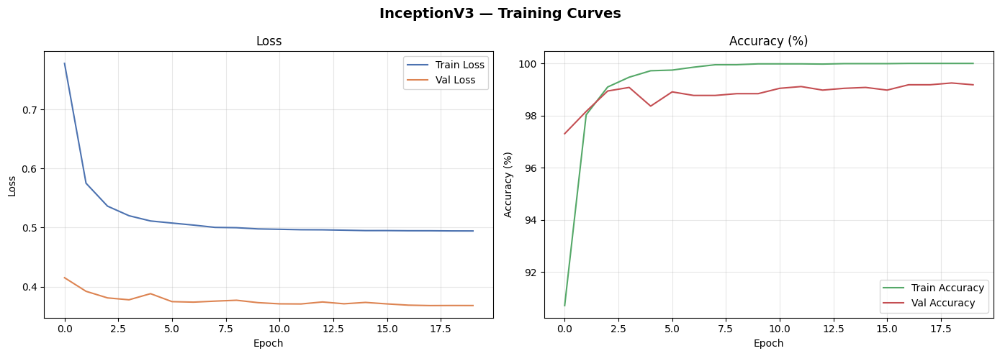

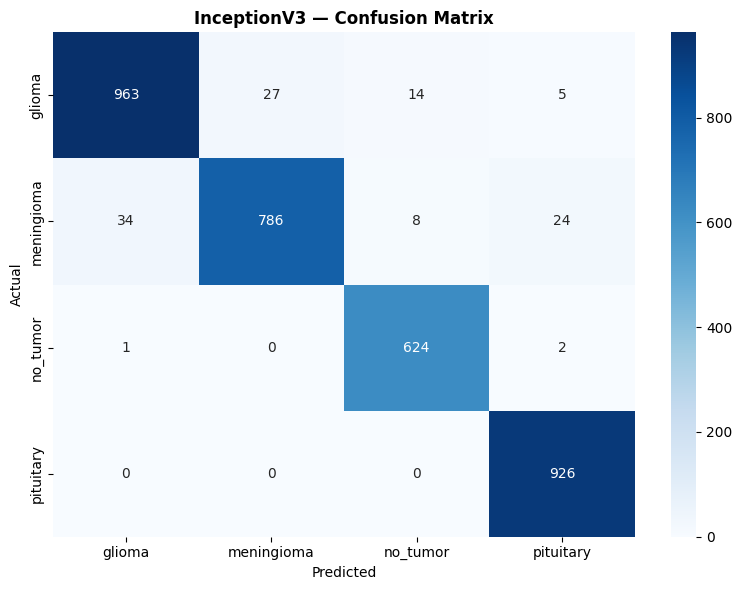

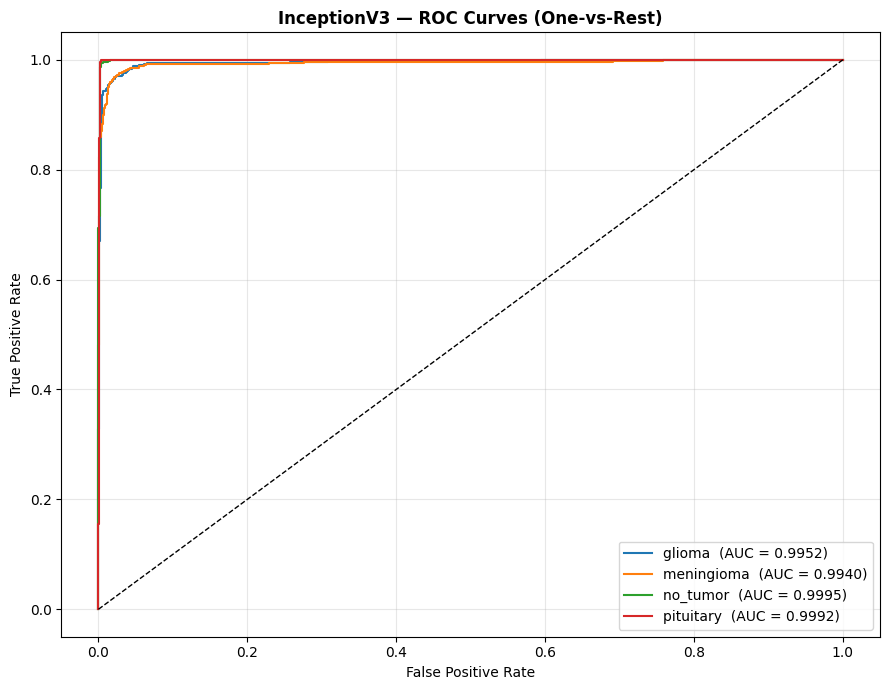

Mean AUC: 0.9969


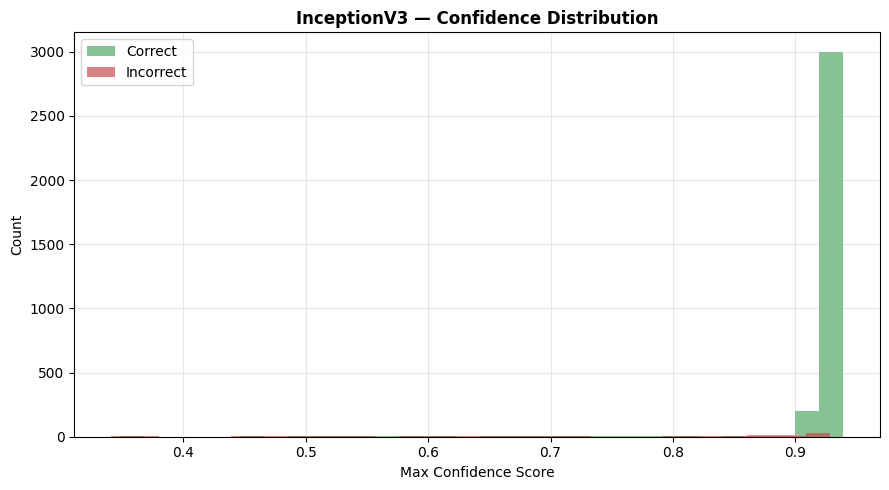

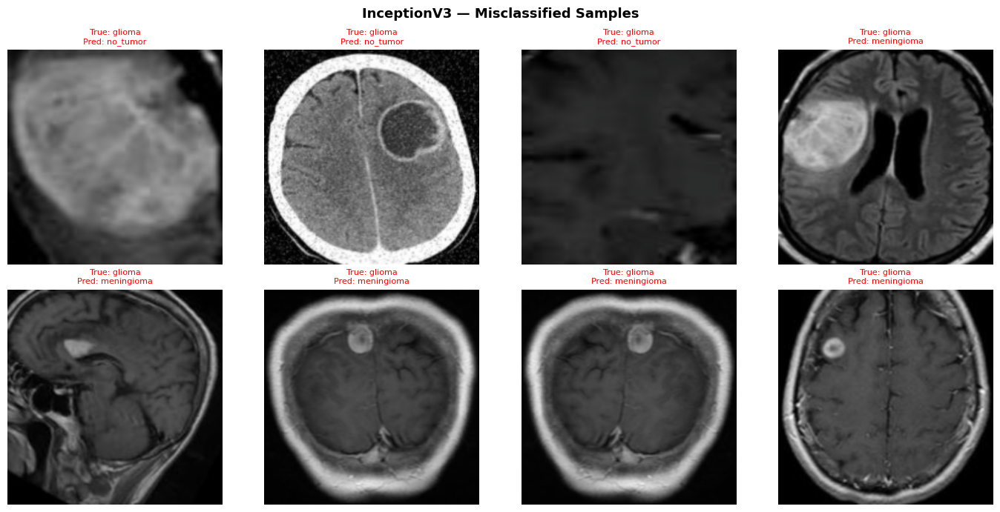

Total misclassified shown: 8


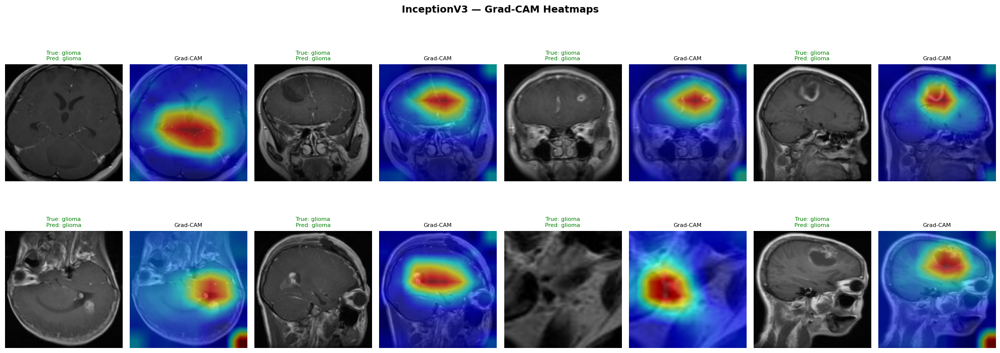

Grad-CAM complete for InceptionV3


In [40]:
# ============================================================
# FIXED: InceptionV3 — Evaluate + Grad-CAM (uses 299x299 test loader)
# ============================================================
inception.load_state_dict(torch.load(history_inception["save_path"], map_location=device))

eval_inception = evaluate_model(inception, inc_test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_inception, MODEL_NAME)
plot_confusion_matrix(eval_inception, CLASS_NAMES, MODEL_NAME)
mean_auc_inception, auc_scores_inception = plot_roc_curves(eval_inception, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_inception, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(inception, inc_test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(inception, MODEL_NAME, inception.Mixed_7c, inc_test_loader, CLASS_NAMES)

In [56]:
save_model_result("InceptionV3", eval_inception, history_inception, mean_auc_inception)


Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models/results/InceptionV3_result.json


---
## PHASE 11 — Model 5: ConvNeXt-Tiny

In [41]:
# ============================================================
# 224x224 DataLoaders — shared by ConvNeXt-Tiny, ViT, and Swin
# Root cause: these three architectures are pretrained on 224x224
# ImageNet crops (16x16 / 4x4 patch grids need to divide 224 evenly),
# while our base pipeline tensors are 176x176. Reusing the InceptionV3
# pattern: wrap the existing (already-normalized) tensors and resize
# them on the fly, instead of rebuilding the dataset from raw images.
# ============================================================

RESIZE_224 = 224

class Resized224Dataset(torch.utils.data.Dataset):
    """Resizes already-normalized tensors to 224x224 on the fly."""
    def __init__(self, base_dataset):
        self.base = base_dataset

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, label, path = self.base[idx]
        img = T.functional.resize(img, [RESIZE_224, RESIZE_224],
                                  interpolation=T.InterpolationMode.BILINEAR,
                                  antialias=True)
        return img, label, path

r224_train_data = Resized224Dataset(train_data)
r224_val_data   = Resized224Dataset(val_data)
r224_test_data  = Resized224Dataset(test_dataset)

train_loader_224 = DataLoader(r224_train_data, batch_size=32, shuffle=True,
                              num_workers=0, collate_fn=standard_collate, drop_last=True)
val_loader_224   = DataLoader(r224_val_data,   batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)
test_loader_224  = DataLoader(r224_test_data,  batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)

print("224x224 loaders ready (shared by ConvNeXt-Tiny / ViT / Swin)")
imgs, _, _ = next(iter(train_loader_224))
print(f"Batch shape: {imgs.shape}")


224x224 loaders ready (shared by ConvNeXt-Tiny / ViT / Swin)
Batch shape: torch.Size([32, 3, 224, 224])


In [42]:
# ============================================================
# ConvNeXt-Tiny — Build Model
#
# Overfitting/underfitting considerations for this model:
#   - Backbone is frozen except the LAST stage (stages.3) + head, so
#     most of the ImageNet-pretrained feature hierarchy is preserved
#     (low risk of overfitting the ~10-12k image MRI set) while the
#     high-level features can still adapt to MRI-specific texture.
#   - drop_path_rate=0.1 adds stochastic depth regularization, which
#     ConvNeXt was designed to use during fine-tuning.
#   - Same AdamW + weight_decay + label_smoothing + batch augmentation
#     already used for the other CNN models applies here too.
# ============================================================
MODEL_NAME = "ConvNeXt_Tiny"

convnext = timm.create_model(
    "convnext_tiny",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_path_rate=0.1
)

for param in convnext.parameters():
    param.requires_grad = False
for name, param in convnext.named_parameters():
    if any(k in name for k in ["stages.3", "head", "norm_pre"]):
        param.requires_grad = True

convnext = convnext.to(device)
trainable = sum(p.numel() for p in convnext.parameters() if p.requires_grad)
print(f"ConvNeXt-Tiny trainable params: {trainable:,}")


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

ConvNeXt-Tiny trainable params: 15,475,204


In [43]:
# ============================================================
# ConvNeXt-Tiny — Train
# ============================================================
criterion_convnext = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_convnext = optim.AdamW(
    filter(lambda p: p.requires_grad, convnext.parameters()),
    lr=2e-4, weight_decay=1e-4
)
scheduler_convnext = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_convnext, T_max=EPOCHS, eta_min=1e-6
)

history_convnext = train_model(
    model=convnext, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_convnext, optimizer=optimizer_convnext,
    scheduler=scheduler_convnext, epochs=EPOCHS
)



 TRAINING: ConvNeXt_Tiny
Epoch [01/20]  Train Loss: 0.6480  Train Acc: 84.98%  Val Loss: 0.4521  Val Acc: 94.81%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.4270  Train Acc: 96.33%  Val Loss: 0.3916  Val Acc: 98.23%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3970  Train Acc: 97.75%  Val Loss: 0.3953  Val Acc: 98.12%
Epoch [04/20]  Train Loss: 0.3798  Train Acc: 98.71%  Val Loss: 0.3939  Val Acc: 98.43%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.3760  Train Acc: 98.75%  Val Loss: 0.3940  Val Acc: 98.29%
Epoch [06/20]  Train Loss: 0.3703  Train Acc: 98.97%  Val Loss: 0.3831  Val Acc: 98.81%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.3662  Train Acc: 99.20%  Val Loss: 0.3927  Val Acc: 98.36%
Epoch [08/20]  Train Loss: 0.3637  Train Acc: 99.37%  Val Loss: 0.3804  Val Acc: 98.81%
Epoch [09/20]  Train Loss: 0.3624  Train Acc: 99.38%  Val Loss: 0.3881  Val Acc: 98.63%
Epoch [10/20]  Train Loss: 0.3606  Train Acc: 99.53%  Val 


 TEST EVALUATION: ConvNeXt_Tiny

Test Accuracy : 97.16%

Classification Report:

              precision    recall  f1-score   support

      glioma       0.96      0.95      0.96      1009
  meningioma       0.96      0.94      0.95       852
    no_tumor       0.98      1.00      0.99       627
   pituitary       0.99      1.00      0.99       926

    accuracy                           0.97      3414
   macro avg       0.97      0.97      0.97      3414
weighted avg       0.97      0.97      0.97      3414



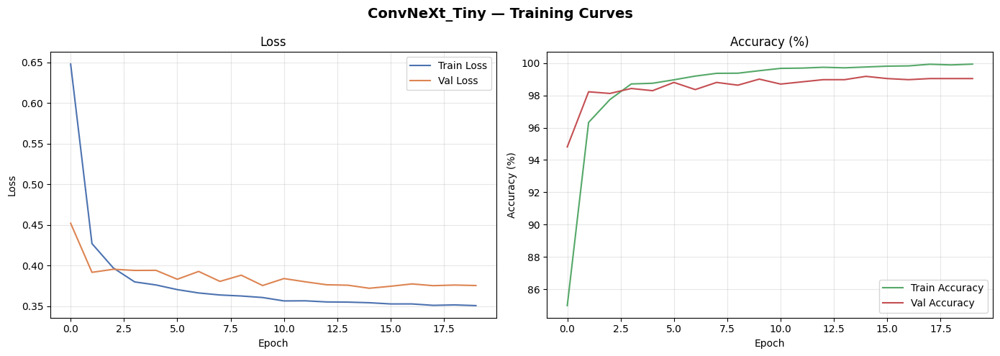

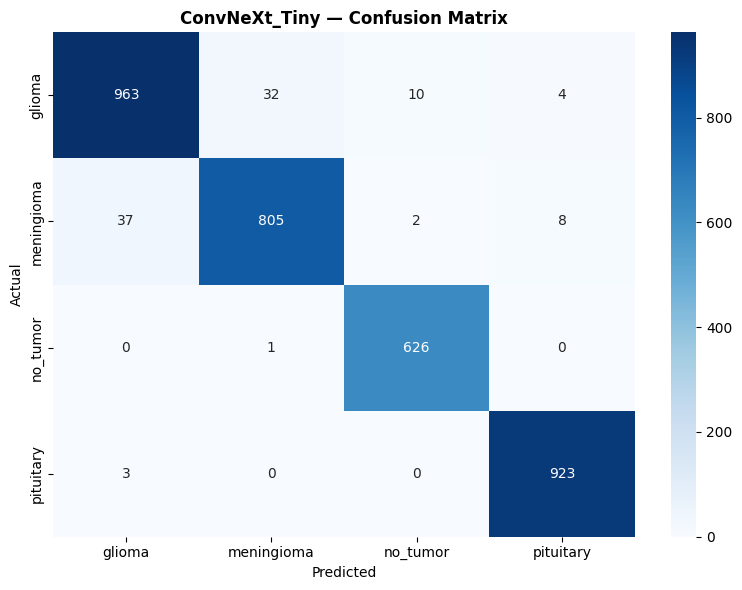

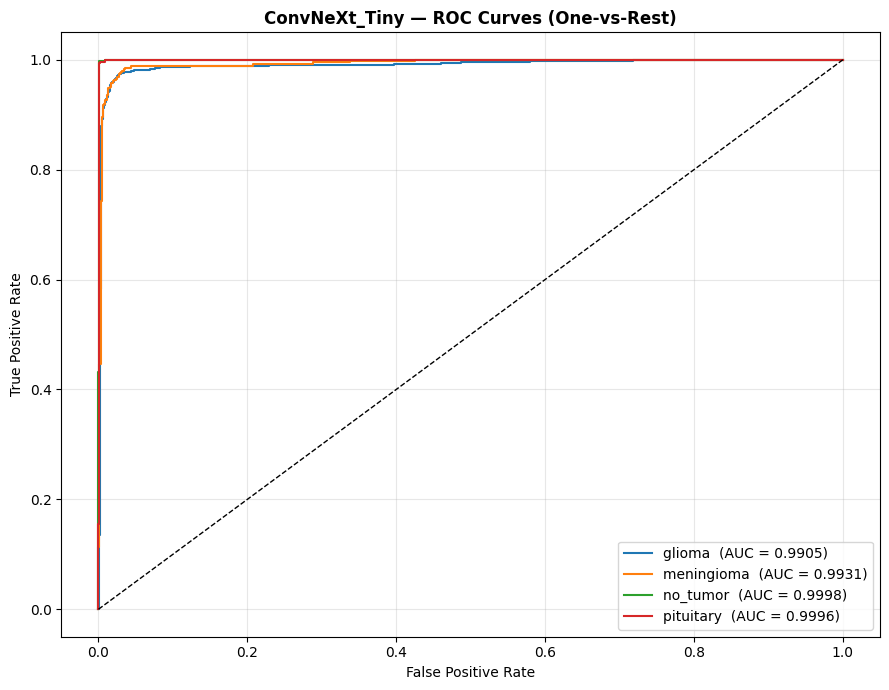

Mean AUC: 0.9958


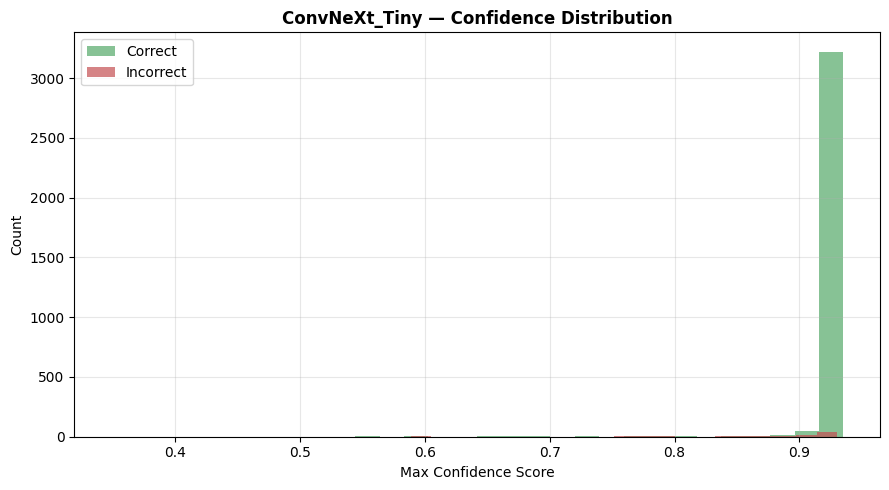

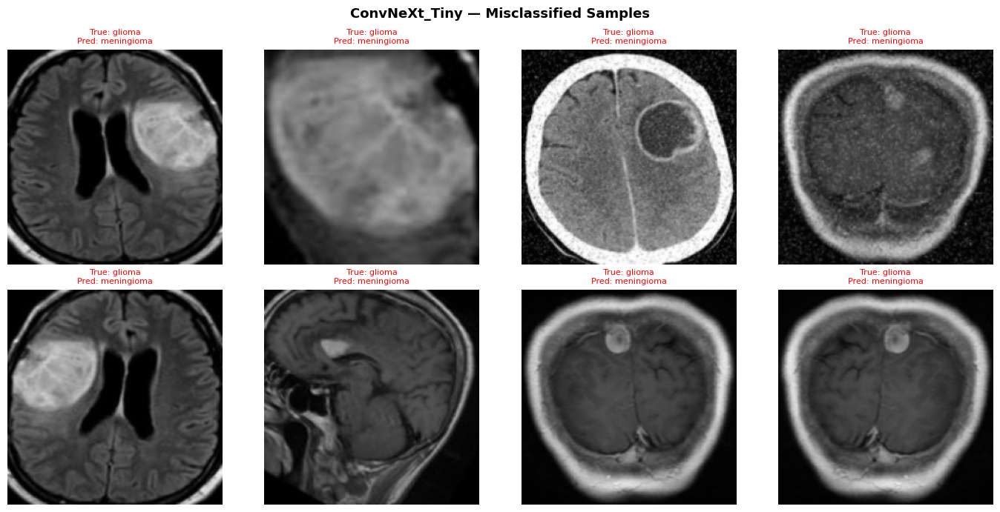

Total misclassified shown: 8


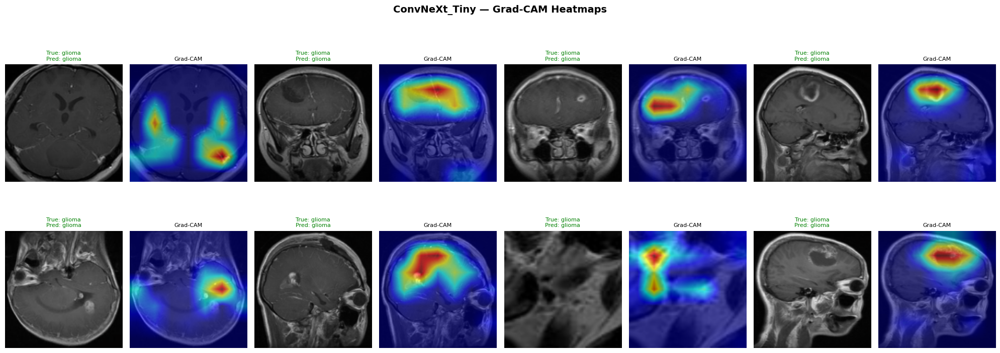

Grad-CAM complete for ConvNeXt_Tiny


In [44]:
# ============================================================
# ConvNeXt-Tiny — Evaluate + Grad-CAM
# ConvNeXt is a convolutional backbone (not tokens), so Grad-CAM works
# the same way as VGG/DenseNet — no reshape_transform needed.
# ============================================================
convnext.load_state_dict(torch.load(history_convnext["save_path"], map_location=device))

eval_convnext = evaluate_model(convnext, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_convnext, MODEL_NAME)
plot_confusion_matrix(eval_convnext, CLASS_NAMES, MODEL_NAME)
mean_auc_convnext, auc_scores_convnext = plot_roc_curves(eval_convnext, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_convnext, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(convnext, test_loader_224, CLASS_NAMES, MODEL_NAME)

run_gradcam(convnext, MODEL_NAME, convnext.stages[-1], test_loader_224, CLASS_NAMES)


In [45]:
save_model_result("ConvNeXt-Tiny", eval_convnext, history_convnext, mean_auc_convnext)


Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models/results/ConvNeXt_Tiny_result.json


---
## PHASE 12 — Model 6: Vision Transformer (ViT)

In [46]:
# ============================================================
# ViT-Small (patch16, 224) — Build Model
#
# Overfitting/underfitting considerations:
#   - vit_small (not vit_base) is used deliberately: fewer parameters
#     means lower overfitting risk on a dataset this size.
#   - Only the last 2 transformer blocks + final norm + head are
#     unfrozen. ViT attention weights are sensitive to fine-tuning;
#     unfreezing the whole network on ~10k images tends to overfit
#     or destabilize the pretrained attention patterns.
#   - drop_rate / attn_drop_rate add dropout inside the MLP and
#     attention blocks as extra regularization.
#   - Learning rate is much lower than the CNN models (5e-5 vs 3e-4):
#     ViTs fine-tune best with small LR — too high causes the
#     pretrained attention maps to collapse (underfitting/instability),
#     too low barely updates the head (underfitting).
# ============================================================
MODEL_NAME = "ViT_Small"

vit = timm.create_model(
    "vit_small_patch16_224",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_rate=0.2,
    attn_drop_rate=0.1
)

for param in vit.parameters():
    param.requires_grad = False
for name, param in vit.named_parameters():
    if any(k in name for k in ["blocks.10", "blocks.11", "norm", "head"]):
        param.requires_grad = True

vit = vit.to(device)
trainable = sum(p.numel() for p in vit.parameters() if p.requires_grad)
print(f"ViT-Small trainable params: {trainable:,}")


model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

ViT-Small trainable params: 3,566,596


In [47]:
# ============================================================
# ViT-Small — Train
# ============================================================
criterion_vit = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vit = optim.AdamW(
    filter(lambda p: p.requires_grad, vit.parameters()),
    lr=5e-5, weight_decay=1e-4
)
scheduler_vit = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vit, T_max=EPOCHS, eta_min=1e-6
)

history_vit = train_model(
    model=vit, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_vit, optimizer=optimizer_vit,
    scheduler=scheduler_vit, epochs=EPOCHS
)



 TRAINING: ViT_Small
Epoch [01/20]  Train Loss: 0.7249  Train Acc: 81.10%  Val Loss: 0.5341  Val Acc: 93.04%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.5055  Train Acc: 93.80%  Val Loss: 0.4573  Val Acc: 95.90%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.4393  Train Acc: 97.17%  Val Loss: 0.4288  Val Acc: 97.34%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.4040  Train Acc: 98.51%  Val Loss: 0.4020  Val Acc: 98.02%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.3849  Train Acc: 99.20%  Val Loss: 0.3950  Val Acc: 98.33%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.3732  Train Acc: 99.60%  Val Loss: 0.3869  Val Acc: 98.57%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.3657  Train Acc: 99.76%  Val Loss: 0.3867  Val Acc: 98.43%
Epoch [08/20]  Train Loss: 0.3621  Train Acc: 99.80%  Val Loss: 0.3802  Val Acc: 98.57%
Epoch [09/20]  Train Loss: 0.3589  Train Acc: 99.88%  Val Loss: 0.3791  Val Acc: 98.60% 


 TEST EVALUATION: ViT_Small

Test Accuracy : 96.46%

Classification Report:

              precision    recall  f1-score   support

      glioma       0.98      0.93      0.95      1009
  meningioma       0.96      0.94      0.95       852
    no_tumor       0.97      1.00      0.98       627
   pituitary       0.95      1.00      0.98       926

    accuracy                           0.96      3414
   macro avg       0.96      0.97      0.97      3414
weighted avg       0.96      0.96      0.96      3414



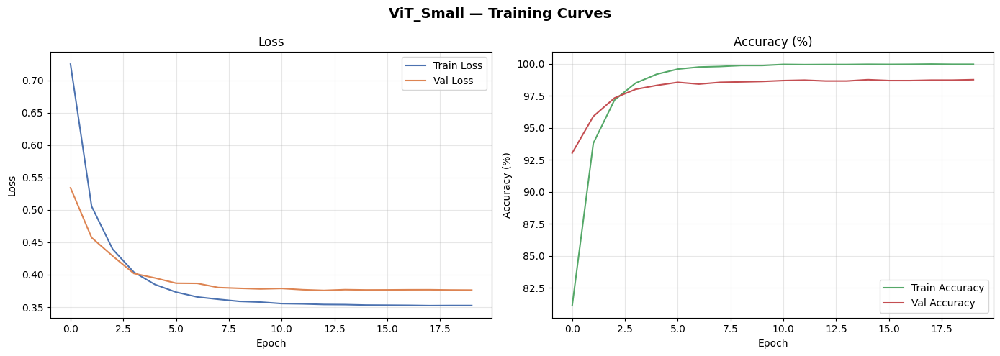

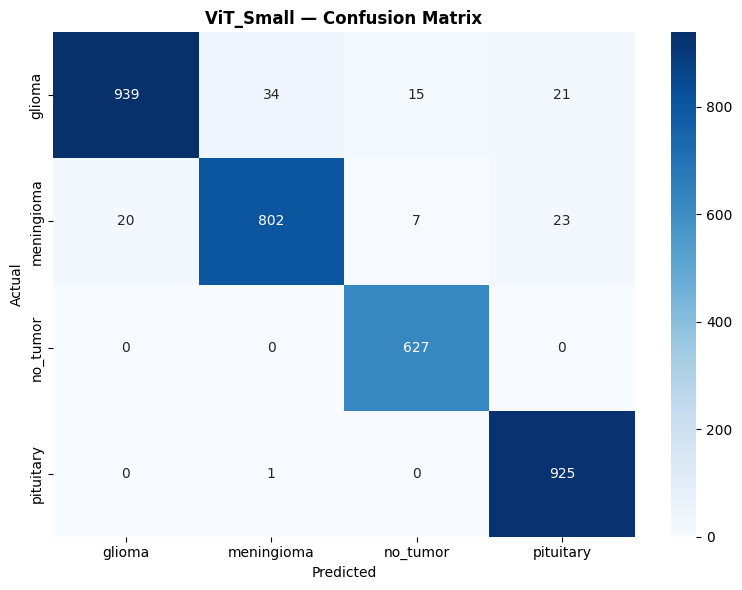

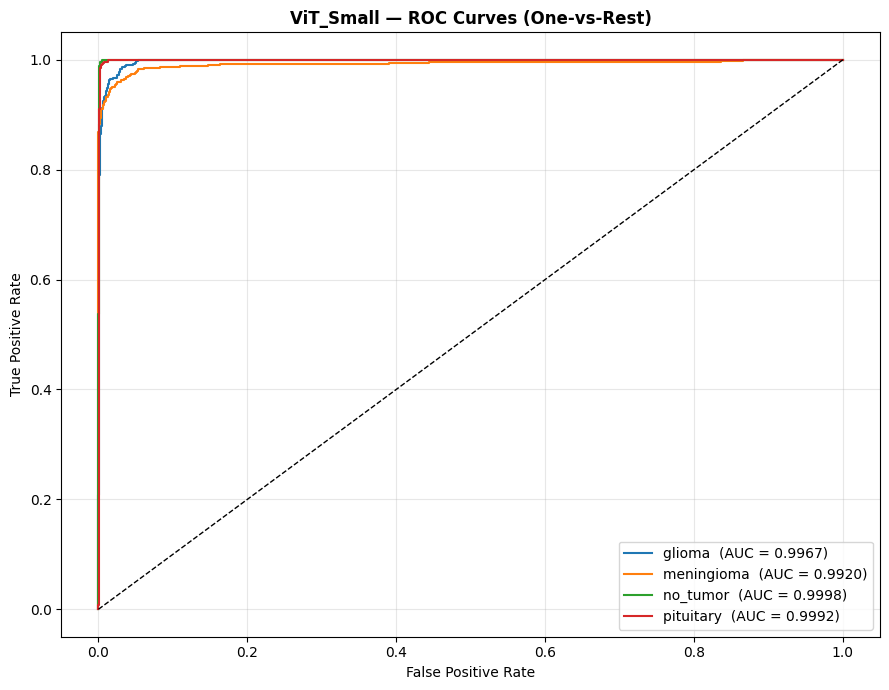

Mean AUC: 0.9969


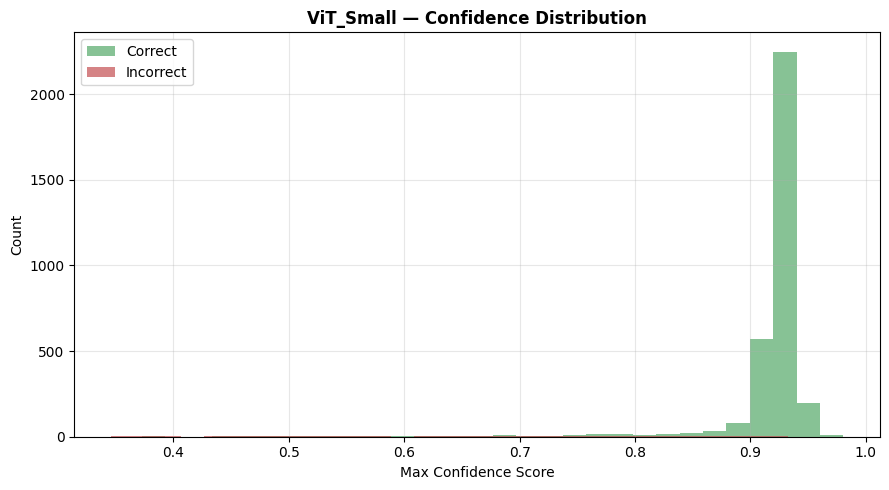

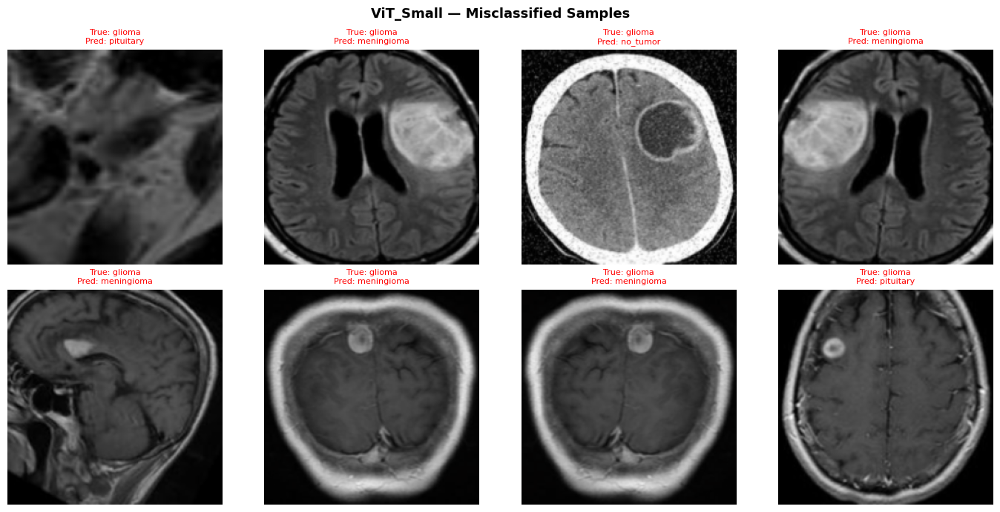

Total misclassified shown: 8


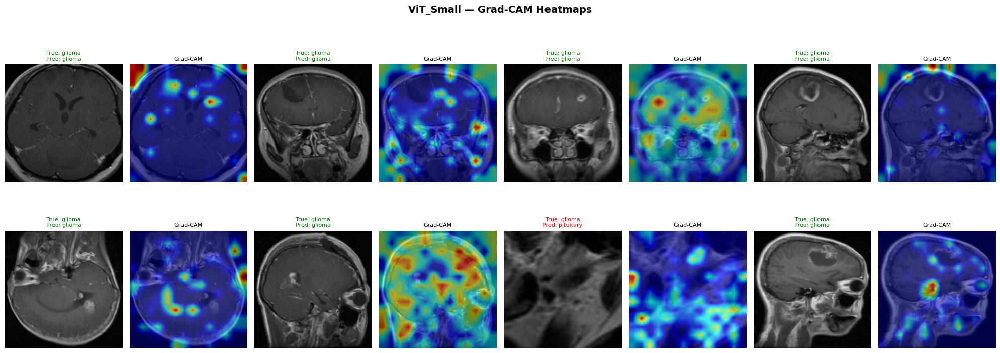

Grad-CAM complete for ViT_Small


In [48]:
# ============================================================
# ViT-Small — Evaluate + Grad-CAM
#
# ViT outputs a (batch, tokens, channels) sequence, not a spatial
# feature map, so standard Grad-CAM can't hook it directly. We use
# reshape_transform to drop the CLS token and fold the remaining
# 14x14=196 patch tokens back into a (batch, channels, 14, 14) map,
# targeting the last block's first LayerNorm (the standard choice
# recommended for ViT Grad-CAM).
# ============================================================
vit.load_state_dict(torch.load(history_vit["save_path"], map_location=device))

eval_vit = evaluate_model(vit, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vit, MODEL_NAME)
plot_confusion_matrix(eval_vit, CLASS_NAMES, MODEL_NAME)
mean_auc_vit, auc_scores_vit = plot_roc_curves(eval_vit, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vit, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vit, test_loader_224, CLASS_NAMES, MODEL_NAME)

def reshape_transform_vit(tensor, height=14, width=14):
    # drop CLS token (index 0), fold the rest into a spatial grid
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)  # -> (B, C, H, W)
    return result

run_gradcam(vit, MODEL_NAME, vit.blocks[-1].norm1, test_loader_224, CLASS_NAMES,
            reshape_transform=reshape_transform_vit)


In [49]:
save_model_result("ViT-Small", eval_vit, history_vit, mean_auc_vit)


Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models/results/ViT_Small_result.json


---
## PHASE 13 — Model 7: Swin Transformer

In [50]:
# ============================================================
# Swin-Tiny (patch4, window7, 224) — Build Model
#
# Overfitting/underfitting considerations:
#   - Only the last stage (layers.3) + final norm + head are unfrozen,
#     same reasoning as ConvNeXt/ViT above — Swin's windowed attention
#     in early stages encodes fairly generic local texture that
#     transfers well and doesn't need to be retrained.
#   - drop_rate + drop_path_rate regularize the MLP and stochastic
#     depth respectively.
#   - Low LR (5e-5), same rationale as ViT: Swin is also a transformer
#     and is sensitive to aggressive fine-tuning LRs.
# ============================================================
MODEL_NAME = "Swin_Tiny"

swin = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_rate=0.2,
    drop_path_rate=0.1
)

for param in swin.parameters():
    param.requires_grad = False
for name, param in swin.named_parameters():
    if any(k in name for k in ["layers.3", "norm", "head"]):
        param.requires_grad = True

swin = swin.to(device)
trainable = sum(p.numel() for p in swin.parameters() if p.requires_grad)
print(f"Swin-Tiny trainable params: {trainable:,}")


model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

Swin-Tiny trainable params: 15,385,204


In [51]:
# ============================================================
# Swin-Tiny — Train
# ============================================================
criterion_swin = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_swin = optim.AdamW(
    filter(lambda p: p.requires_grad, swin.parameters()),
    lr=5e-5, weight_decay=1e-4
)
scheduler_swin = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_swin, T_max=EPOCHS, eta_min=1e-6
)

history_swin = train_model(
    model=swin, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_swin, optimizer=optimizer_swin,
    scheduler=scheduler_swin, epochs=EPOCHS
)



 TRAINING: Swin_Tiny
Epoch [01/20]  Train Loss: 0.6250  Train Acc: 87.01%  Val Loss: 0.4590  Val Acc: 95.15%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.4404  Train Acc: 96.49%  Val Loss: 0.4101  Val Acc: 97.92%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3968  Train Acc: 98.34%  Val Loss: 0.3875  Val Acc: 98.74%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.3797  Train Acc: 99.02%  Val Loss: 0.3796  Val Acc: 98.91%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.3702  Train Acc: 99.48%  Val Loss: 0.3768  Val Acc: 98.70%
Epoch [06/20]  Train Loss: 0.3673  Train Acc: 99.49%  Val Loss: 0.3769  Val Acc: 98.84%
Epoch [07/20]  Train Loss: 0.3653  Train Acc: 99.60%  Val Loss: 0.3738  Val Acc: 99.04%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.3615  Train Acc: 99.74%  Val Loss: 0.3724  Val Acc: 99.04%
Epoch [09/20]  Train Loss: 0.3601  Train Acc: 99.75%  Val Loss: 0.3722  Val Acc: 99.04%
Epoch [10/20]  Train Loss: 0.35


 TEST EVALUATION: Swin_Tiny

Test Accuracy : 97.28%

Classification Report:

              precision    recall  f1-score   support

      glioma       0.98      0.94      0.96      1009
  meningioma       0.95      0.96      0.96       852
    no_tumor       0.98      1.00      0.99       627
   pituitary       0.99      1.00      0.99       926

    accuracy                           0.97      3414
   macro avg       0.97      0.98      0.97      3414
weighted avg       0.97      0.97      0.97      3414



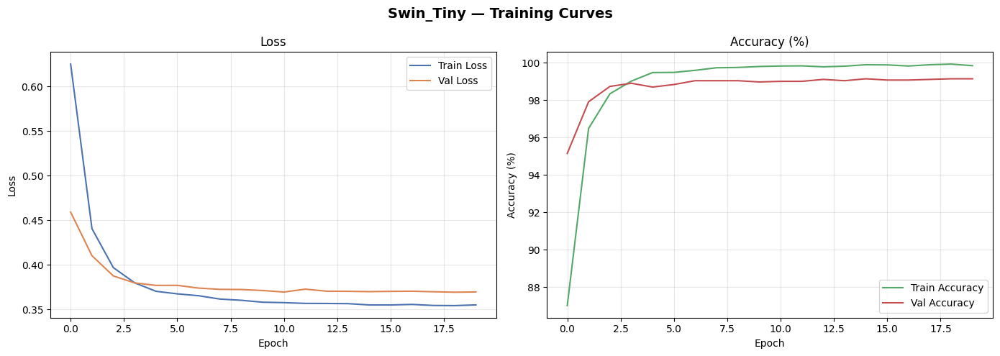

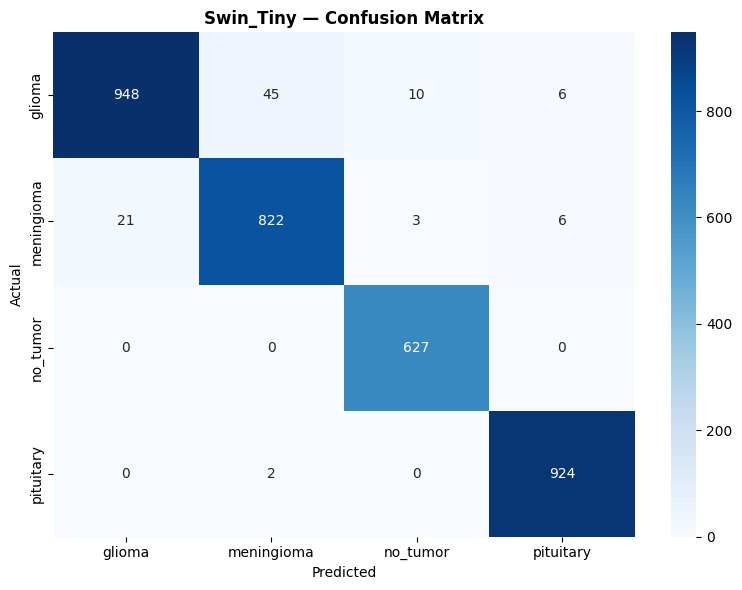

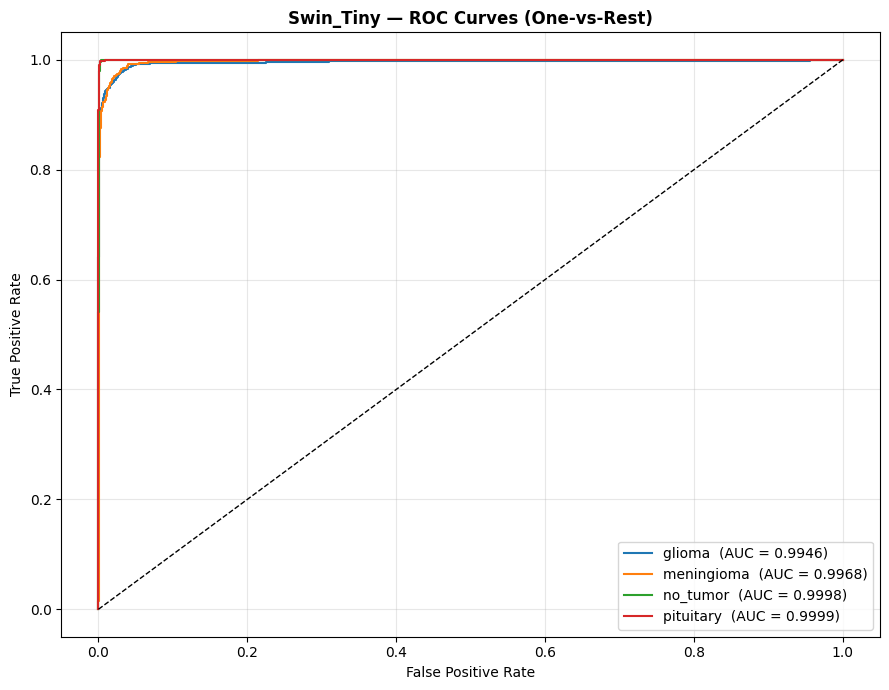

Mean AUC: 0.9978


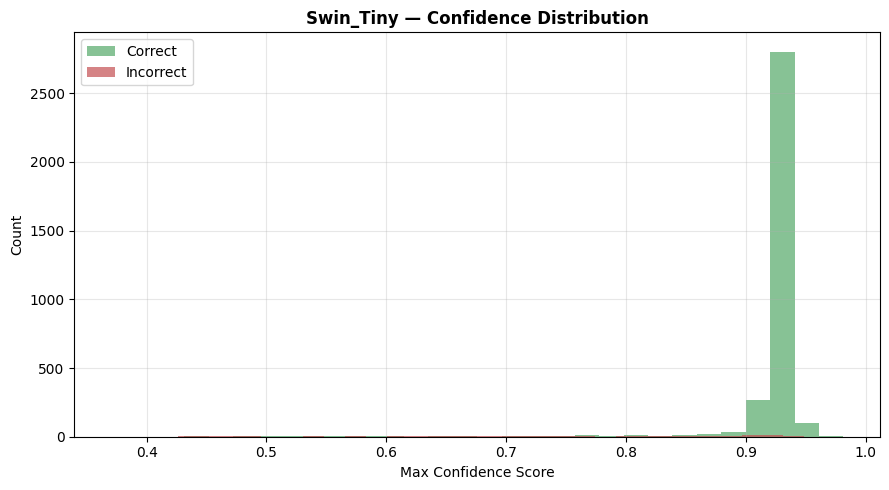

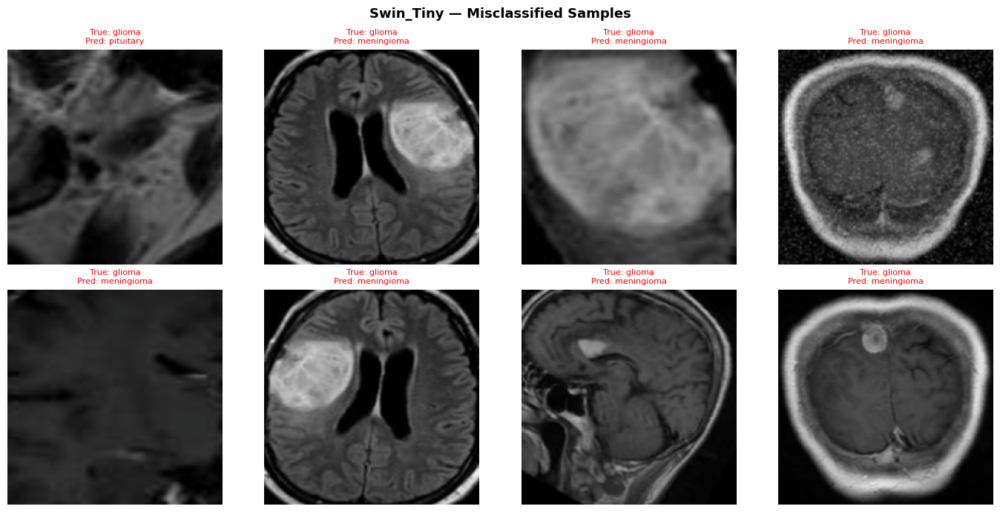

Total misclassified shown: 8


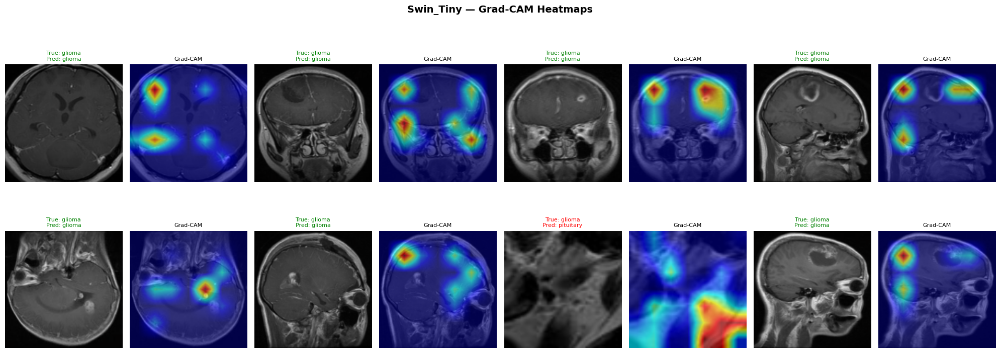

Grad-CAM complete for Swin_Tiny


In [52]:
# ============================================================
# Swin-Tiny — Evaluate + Grad-CAM
#
# Like ViT, Swin's final stage outputs (batch, tokens, channels) with
# no CLS token this time — at 224 input with window7/patch4, the last
# stage resolution is 7x7=49 tokens. reshape_transform folds these
# back into a (batch, channels, 7, 7) map.
# ============================================================
swin.load_state_dict(torch.load(history_swin["save_path"], map_location=device))

eval_swin = evaluate_model(swin, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_swin, MODEL_NAME)
plot_confusion_matrix(eval_swin, CLASS_NAMES, MODEL_NAME)
mean_auc_swin, auc_scores_swin = plot_roc_curves(eval_swin, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_swin, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(swin, test_loader_224, CLASS_NAMES, MODEL_NAME)

def reshape_transform_swin(tensor, height=7, width=7):
    result = tensor.reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)  # -> (B, C, H, W)
    return result

run_gradcam(swin, MODEL_NAME, swin.layers[-1].blocks[-1].norm2, test_loader_224, CLASS_NAMES,
            reshape_transform=reshape_transform_swin)


In [53]:
save_model_result("Swin-Tiny", eval_swin, history_swin, mean_auc_swin)


Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models/results/Swin_Tiny_result.json


---
## PHASE 14 — Model Comparison Dashboard

In [62]:
# ============================================================
# PHASE 14 — Model Comparison Dashboard (Drive-backed)
# Rebuilds the comparison from saved JSON results on Google Drive.
# Works in a brand-new runtime -- you do NOT need to have trained
# or evaluated any model in this session. Just mount Drive (Phase 2)
# and run this cell once results exist for the models you care about.
# ============================================================
df_comparison = load_all_model_results()
df_comparison["Rank"] = df_comparison["Test Accuracy (%)"].rank(ascending=False).astype(int)
df_comparison = df_comparison.sort_values("Test Accuracy (%)", ascending=False).reset_index(drop=True)

print("\n" + "="*80)
print(" MODEL COMPARISON SUMMARY  (sorted by Test Accuracy)")
print(f" Models found: {len(df_comparison)} / 7")
if len(df_comparison) < 7:
    missing = {"VGG16","VGG19","DenseNet121","InceptionV3","ConvNeXt-Tiny","ViT-Small","Swin-Tiny"} - set(df_comparison["Model"])
    print(f" Still missing: {sorted(missing)}")
print("="*80)
print(df_comparison.to_string(index=False))
print("="*80)
print(f"\n  BEST MODEL   : {df_comparison.iloc[0]['Model']}")
print(f"  Test Accuracy: {df_comparison.iloc[0]['Test Accuracy (%)']:.2f}%")
print(f"  Mean AUC     : {df_comparison.iloc[0]['Mean AUC']:.4f}")
print(f"  Best Val Acc : {df_comparison.iloc[0]['Best Val Acc (%)']:.2f}%")
print("="*80)



 MODEL COMPARISON SUMMARY  (sorted by Test Accuracy)
 Models found: 7 / 7
        Model  Test Accuracy (%)  Mean AUC  Training Time (min)  Best Val Acc (%)  Rank
  DenseNet121          98.476860  0.999316            16.849856         99.453925     1
    Swin-Tiny          97.275923  0.997776            33.538669         99.146758     2
ConvNeXt-Tiny          97.158758  0.995752            19.443280         99.180887     3
  InceptionV3          96.631517  0.996948            31.932692         99.249147     4
        VGG16          96.602226  0.994222            26.146619         98.839590     5
    ViT-Small          96.455770  0.996944            20.622706         98.771331     6
        VGG19          95.489162  0.993406            26.843047         98.668942     7

  BEST MODEL   : DenseNet121
  Test Accuracy: 98.48%
  Mean AUC     : 0.9993
  Best Val Acc : 99.45%


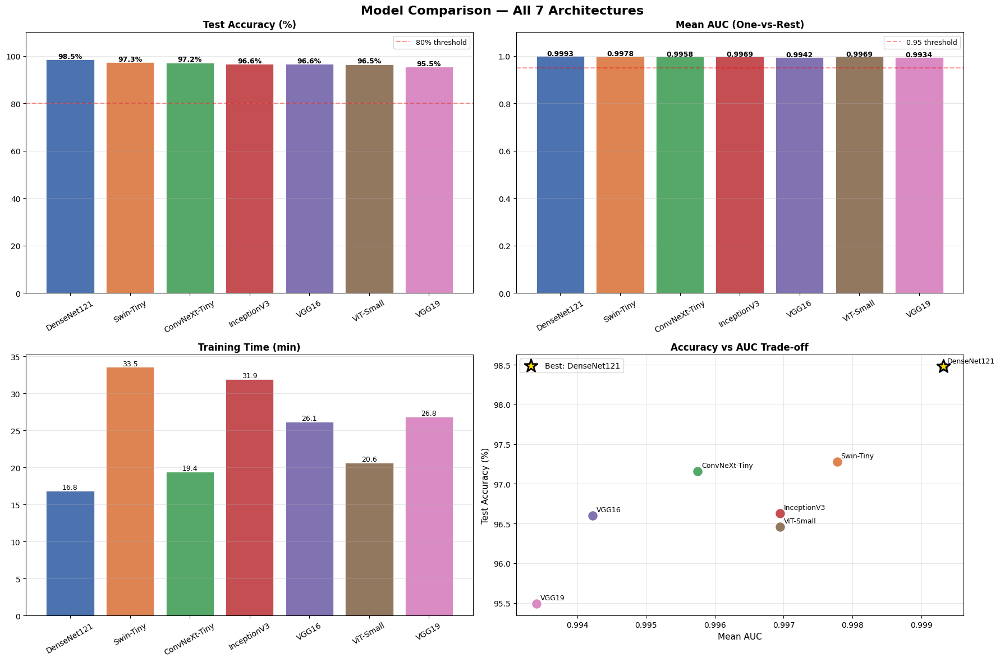


Comparison dashboard saved to /content/model_comparison_dashboard.png
Comparison dashboard + CSV saved to Google Drive.

BEST MODEL: DenseNet121
  Accuracy : 98.48%
  Mean AUC : 0.9993


In [63]:
# ============================================================
# Comparison Visualization — 4-panel dashboard
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle("Model Comparison — All 7 Architectures", fontsize=16, fontweight='bold')

colors = ['#4C72B0','#DD8452','#55A868','#C44E52','#8172B2','#937860','#DA8BC3']
models_sorted = df_comparison["Model"].tolist()

# ── 1. Test Accuracy ──
ax = axes[0, 0]
bars = ax.bar(models_sorted, df_comparison["Test Accuracy (%)"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Test Accuracy (%)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 110)
ax.axhline(y=80, color='red', linestyle='--', alpha=0.4, label='80% threshold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
ax.legend(fontsize=9)
for bar, val in zip(bars, df_comparison["Test Accuracy (%)"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{val:.1f}%', ha='center', fontsize=9, fontweight='bold')

# ── 2. Mean AUC ──
ax = axes[0, 1]
bars = ax.bar(models_sorted, df_comparison["Mean AUC"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Mean AUC (One-vs-Rest)", fontweight='bold', fontsize=12)
ax.set_ylim(0, 1.1)
ax.axhline(y=0.95, color='red', linestyle='--', alpha=0.4, label='0.95 threshold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
ax.legend(fontsize=9)
for bar, val in zip(bars, df_comparison["Mean AUC"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
            f'{val:.4f}', ha='center', fontsize=9, fontweight='bold')

# ── 3. Training Time ──
ax = axes[1, 0]
bars = ax.bar(models_sorted, df_comparison["Training Time (min)"], color=colors, edgecolor='white', linewidth=0.5)
ax.set_title("Training Time (min)", fontweight='bold', fontsize=12)
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
for bar, val in zip(bars, df_comparison["Training Time (min)"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
            f'{val:.1f}', ha='center', fontsize=9)

# ── 4. Accuracy vs AUC scatter ──
ax = axes[1, 1]
for i, row in df_comparison.iterrows():
    ax.scatter(row["Mean AUC"], row["Test Accuracy (%)"],
               color=colors[i], s=180, zorder=5, edgecolors='white', linewidth=1.5)
    ax.annotate(row["Model"], (row["Mean AUC"], row["Test Accuracy (%)"]),
                textcoords="offset points", xytext=(5, 5), fontsize=9)
ax.set_xlabel("Mean AUC", fontsize=11)
ax.set_ylabel("Test Accuracy (%)", fontsize=11)
ax.set_title("Accuracy vs AUC Trade-off", fontweight='bold', fontsize=12)
ax.grid(alpha=0.3)
# Highlight best model
best = df_comparison.iloc[0]
ax.scatter(best["Mean AUC"], best["Test Accuracy (%)"],
           s=300, color='gold', zorder=6, edgecolors='black', linewidth=2,
           marker='*', label=f'Best: {best["Model"]}')
ax.legend(fontsize=10)

plt.tight_layout()
plt.savefig("/content/model_comparison_dashboard.png", dpi=150, bbox_inches='tight')
plt.show()
print("\nComparison dashboard saved to /content/model_comparison_dashboard.png")

# Also save to Drive
import shutil, os
drive_dir = "/content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor MRI images/saved_models"
os.makedirs(drive_dir, exist_ok=True)
try:
    shutil.copy2("/content/model_comparison_dashboard.png",
                 f"{drive_dir}/model_comparison_dashboard.png")
    df_comparison.to_csv(f"{drive_dir}/model_comparison_results.csv", index=False)
    print("Comparison dashboard + CSV saved to Google Drive.")
except Exception as e:
    print(f"Drive save skipped: {e}")

print(f"\nBEST MODEL: {df_comparison.iloc[0]['Model']}")
print(f"  Accuracy : {df_comparison.iloc[0]['Test Accuracy (%)']:.2f}%")
print(f"  Mean AUC : {df_comparison.iloc[0]['Mean AUC']:.4f}")


In [ ]:
# ============================================================
# PHASE 15 — Download All Best Model Weights
# ============================================================
from google.colab import files

model_files = [
    "/content/VGG16_best.pth",
    "/content/VGG19_best.pth",
    "/content/DenseNet121_best.pth",
    "/content/InceptionV3_best.pth",
    "/content/ConvNeXt_Tiny_best.pth",
    "/content/ViT_Small_best.pth",
    "/content/Swin_Tiny_best.pth",
]

for f in model_files:
    if os.path.exists(f):
        print(f"Downloading {f} ...")
        files.download(f)
    else:
        print(f"NOT FOUND (not yet trained): {f}")

print("\nAll available model weights downloaded.")


---
## ✅ Pipeline Complete

**Outputs produced per model:**
- Confusion Matrix
- Classification Report (Precision / Recall / F1)
- Training & Validation Loss Curve
- Training & Validation Accuracy Curve
- ROC Curves (per class) + Mean AUC
- Confidence Distribution Plot
- Error Analysis (Misclassified Samples)
- Grad-CAM Heatmaps

**Final Phase 14:** All 7 models compared on Accuracy, AUC, and Training Time.